# 03 Strict Validation And Test Per-Ticker Model Comparison

This notebook loads strict protocol artifacts produced by `02_table_model_forecasting.ipynb`. Validation metrics are used for model-selection diagnostics, while test metrics remain out-of-sample evaluation.

In [1]:
from pathlib import Path
import sys

cwd = Path.cwd().resolve()
for candidate in [cwd, cwd / "forecasting", cwd.parent, cwd.parent / "forecasting"]:
    if (candidate / "src" / "stock_forecast").exists():
        PROJECT_DIR = candidate
        break
else:
    raise RuntimeError("Cannot locate forecasting project directory with src/stock_forecast")

SRC_DIR = PROJECT_DIR / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

ARTIFACT_DIR = PROJECT_DIR / "artifacts"
DATA_DIR = ARTIFACT_DIR / "data"
REPORTS_DIR = ARTIFACT_DIR / "reports"
PLOTS_DIR = ARTIFACT_DIR / "plots"
for path in [DATA_DIR, REPORTS_DIR, PLOTS_DIR]:
    path.mkdir(parents=True, exist_ok=True)

print(f"PROJECT_DIR = {PROJECT_DIR}")

PROJECT_DIR = /home/sapce/forecasting_stock_prices/forecasting


In [2]:
from pathlib import Path
import json
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

from stock_forecast.artifacts import load_json, load_table, save_json, save_table
from stock_forecast.backtest import run_test_signal_backtest

pd.set_option("display.max_columns", 160)
plt.style.use("default")


## Notebook Constants

In [3]:
PRIMARY_METRIC = "directional_accuracy"
HORIZONS = [
    {"name": "week", "horizon": 5},
    {"name": "month", "horizon": 21},
]
MAX_TICKER_PLOTS = None
SCATTER_SAMPLE = 5000
PREDICTION_METRIC_COLS = ["mae", "rmse", "r2", "pearson", "spearman", "directional_accuracy"]
SIGNAL_METRIC_COLS = ["cumulative_return", "annualized_return", "annualized_volatility", "sharpe", "sortino", "max_drawdown", "calmar", "turnover", "number_of_trades", "n_rebalances"]
SIGNAL_COMPARISON_COLS = ["cumulative_return", "annualized_return", "sharpe", "sortino", "max_drawdown", "calmar", "turnover", "number_of_trades"]
VALIDATION_BAR_METRIC_COLS = ["sharpe", "sortino", "calmar", "cumulative_return", "max_drawdown", "turnover", "number_of_trades"]
HEADLINE_SIGNAL_MODE = "overlapping_tranches"
TRANSACTION_COST_BPS = 10.0
SLIPPAGE_BPS = 5.0
LONG_THRESHOLD = 0.0
SIGNAL_ANCHOR = "expanding_median"


## Load Strict Test Artifacts

In [4]:
def table_exists(path: Path) -> bool:
    return path.exists() or path.with_suffix(".csv").exists()


def safe_filename(value: str) -> str:
    return re.sub(r"[^A-Za-z0-9_.-]+", "_", str(value)).strip("._") or "ticker"


horizon_results = {}
required_files = [
    "outer_splits.parquet",
    "validation_predictions.parquet",
    "test_predictions.parquet",
    "validation_model_ranking.parquet",
    "validation_prediction_metrics.parquet",
    "selected_models_by_ticker.parquet",
    "test_prediction_metrics.parquet",
    "test_signal_equity.parquet",
    "test_signal_metrics.parquet",
    "leakage_audit.parquet",
]

for spec in HORIZONS:
    horizon_name = spec["name"]
    horizon = int(spec["horizon"])
    artifact_dir = ARTIFACT_DIR / "horizons" / horizon_name / "strict_protocol"
    reports_dir = artifact_dir / "reports"
    plots_dir = artifact_dir / "plots"
    ticker_plots_dir = plots_dir / "tickers"
    summary_plots_dir = plots_dir / "summary"
    ticker_plots_dir.mkdir(parents=True, exist_ok=True)
    summary_plots_dir.mkdir(parents=True, exist_ok=True)

    missing = [name for name in required_files if not table_exists(reports_dir / name)]
    if missing:
        raise FileNotFoundError(
            f"Missing strict test artifacts for {horizon_name}: {missing}. "
            "Run notebooks/02_table_model_forecasting.ipynb with the strict protocol first."
        )

    result = {
        "horizon": horizon,
        "artifact_dir": artifact_dir,
        "reports_dir": reports_dir,
        "plots_dir": plots_dir,
        "ticker_plots_dir": ticker_plots_dir,
        "summary_plots_dir": summary_plots_dir,
        "outer_splits": load_table(reports_dir / "outer_splits.parquet"),
        "validation_predictions": load_table(reports_dir / "validation_predictions.parquet"),
        "test_predictions": load_table(reports_dir / "test_predictions.parquet"),
        "validation_model_ranking": load_table(reports_dir / "validation_model_ranking.parquet"),
        "selected_models_by_ticker": load_table(reports_dir / "selected_models_by_ticker.parquet"),
        "validation_prediction_metrics": load_table(reports_dir / "validation_prediction_metrics.parquet"),
        "test_prediction_metrics": load_table(reports_dir / "test_prediction_metrics.parquet"),
        "test_signal_equity": load_table(reports_dir / "test_signal_equity.parquet"),
        "test_signal_metrics": load_table(reports_dir / "test_signal_metrics.parquet"),
        "leakage_audit": load_table(reports_dir / "leakage_audit.parquet"),
        "best_params": load_json(reports_dir / "best_params.json") if (reports_dir / "best_params.json").exists() else [],
    }
    for frame_name in ["validation_predictions", "test_predictions", "test_signal_equity"]:
        frame = result[frame_name]
        for col in ["date", "signal_date", "entry_date", "target_date"]:
            if col in frame.columns:
                frame[col] = pd.to_datetime(frame[col])

    tickers = sorted(result["test_predictions"]["ticker"].dropna().astype(str).unique())
    result["tickers"] = tickers
    result["plot_tickers"] = tickers[:MAX_TICKER_PLOTS] if MAX_TICKER_PLOTS is not None else tickers
    horizon_results[horizon_name] = result

    print(f"=== Strict test comparison: {horizon_name} ({horizon} trading days) ===")
    display(result["outer_splits"])
    display(result["validation_model_ranking"])
    display(result["selected_models_by_ticker"])
    display(result["test_prediction_metrics"])
    display(result["test_signal_metrics"])
    display(result["leakage_audit"])

    failed = result["leakage_audit"][~result["leakage_audit"]["passed"]]
    if not failed.empty:
        raise AssertionError(f"Strict protocol leakage audit failed for {horizon_name}: {failed['check'].tolist()}")


=== Strict test comparison: week (5 trading days) ===


,ticker,status,split_quality,limited_history,n_obs,n_train_available,n_train,n_refit_available,n_refit,max_train_rows,n_validation,n_test,train_start,train_end,refit_start,refit_end,validation_start,validation_end,test_start,test_end,train_target_end,refit_target_end,validation_target_end,test_target_end,horizon_name,horizon
0,CBOM,ok,mature,False,2539,2287,1260,2413,1260,1260,126,126,2019-12-02,2024-12-17,2020-06-05,2025-05-23,2024-12-18,2025-05-23,2025-05-26,2025-10-07,2024-12-25,2025-05-31,2025-05-31,2025-10-13,week,5
1,MBNK,ok,limited_history,True,318,190,190,254,254,1260,64,64,2024-09-05,2025-05-21,2024-09-05,2025-07-29,2025-05-22,2025-07-29,2025-07-30,2025-10-07,2025-05-29,2025-08-06,2025-08-06,2025-10-13,week,5
2,SBER,ok,mature,False,4410,4158,1260,4284,1260,1260,126,126,2019-12-02,2024-12-17,2020-06-05,2025-05-23,2024-12-18,2025-05-23,2025-05-26,2025-10-07,2024-12-25,2025-05-31,2025-05-31,2025-10-13,week,5
3,SBERP,ok,mature,False,4410,4158,1260,4284,1260,1260,126,126,2019-12-02,2024-12-17,2020-06-05,2025-05-23,2024-12-18,2025-05-23,2025-05-26,2025-10-07,2024-12-25,2025-05-31,2025-05-31,2025-10-13,week,5
4,SVCB,ok,limited_history,True,417,251,251,334,334,1260,83,83,2024-04-27,2025-04-09,2024-04-27,2025-07-10,2025-04-10,2025-07-10,2025-07-11,2025-10-07,2025-04-15,2025-07-16,2025-07-16,2025-10-13,week,5
5,T,ok,mature,False,1420,1168,1168,1294,1260,1260,126,126,2020-03-13,2024-12-13,2020-04-30,2025-05-21,2024-12-16,2025-05-21,2025-05-22,2025-10-07,2024-12-23,2025-05-29,2025-05-29,2025-10-13,week,5
6,VTBR,ok,mature,False,4366,4114,1260,4240,1260,1260,126,126,2019-11-26,2024-12-17,2020-06-01,2025-05-23,2024-12-18,2025-05-23,2025-05-26,2025-10-07,2024-12-25,2025-05-31,2025-05-31,2025-10-13,week,5


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,validation_rank,is_validation_selected
0,validation,CBOM,momentum,126,0.050542,0.064387,-0.032487,0.238607,0.135598,0.603175,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,1,True
1,validation,CBOM,ridge,126,0.057839,0.074645,-0.387685,0.016420,0.056540,0.523810,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,2,False
2,validation,CBOM,naive_persistence,126,0.056416,0.070545,-0.239402,0.014613,0.006740,0.500000,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,3,False
3,validation,CBOM,lstm,126,0.050201,0.064949,-0.050582,0.017727,0.013129,0.460317,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,4,False
4,validation,CBOM,lightgbm,126,0.053503,0.068831,-0.179917,-0.093521,-0.077801,0.452381,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,5,False
5,validation,CBOM,hist_gradient_boosting,126,0.055051,0.070015,-0.220879,-0.089669,-0.068302,0.436508,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,6,False
6,validation,CBOM,xgboost,126,0.051171,0.065275,-0.061157,NaN,NaN,0.420635,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,7,False
7,validation,CBOM,catboost,126,0.052434,0.067718,-0.142078,-0.022527,-0.067333,0.412698,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,8,False
8,validation,MBNK,lstm,64,0.035874,0.047401,-1.229204,0.213218,0.205311,0.656250,week,5,limited_history,True,184,190,6,190,1260,2024-09-05,2025-05-15,1,True
9,validation,MBNK,ridge,64,0.197472,0.248458,-60.245625,0.147357,0.150504,0.640625,week,5,limited_history,True,184,190,6,190,1260,2024-09-05,2025-05-15,2,False


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,validation_rank,is_validation_selected
0,validation,CBOM,momentum,126,0.050542,0.064387,-0.032487,0.238607,0.135598,0.603175,week,5,mature,False,1254,1260,6,2287,1260,2019-12-02,2024-12-09,1,True
1,validation,MBNK,lstm,64,0.035874,0.047401,-1.229204,0.213218,0.205311,0.656250,week,5,limited_history,True,184,190,6,190,1260,2024-09-05,2025-05-15,1,True
2,validation,SBER,momentum,126,0.027809,0.039988,-0.045619,-0.168581,-0.124199,0.547619,week,5,mature,False,1254,1260,6,4158,1260,2019-12-02,2024-12-09,1,True
3,validation,SBERP,lightgbm,126,0.026205,0.037377,-0.038405,0.010505,0.011066,0.579365,week,5,mature,False,1254,1260,6,4158,1260,2019-12-02,2024-12-09,1,True
4,validation,SVCB,naive_persistence,83,0.034945,0.043822,-0.198469,0.012300,0.005080,0.530120,week,5,limited_history,True,245,251,6,251,1260,2024-04-27,2025-04-03,1,True
5,validation,T,xgboost,126,0.040494,0.054616,-0.022131,NaN,NaN,0.666667,week,5,mature,False,1162,1168,6,1168,1260,2020-03-13,2024-12-05,1,True
6,validation,VTBR,lstm,126,0.047678,0.065448,-0.100276,0.072973,0.091876,0.515873,week,5,mature,False,1254,1260,6,4114,1260,2019-11-26,2024-12-09,1,True


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_refit_available,max_train_rows,train_start,train_end,validation_rank,is_validation_selected,validation_directional_accuracy
0,test,CBOM,catboost,126,0.035405,0.045339,-0.177474,0.158048,0.165612,0.444444,week,5,mature,False,1254,1260,6,2413,1260,2020-06-05,2025-05-17,8,False,0.412698
1,test,CBOM,hist_gradient_boosting,126,0.037630,0.047119,-0.271767,0.086560,0.108110,0.500000,week,5,mature,False,1254,1260,6,2413,1260,2020-06-05,2025-05-17,6,False,0.436508
2,test,CBOM,lightgbm,126,0.034566,0.043893,-0.103584,0.095166,0.137590,0.515873,week,5,mature,False,1254,1260,6,2413,1260,2020-06-05,2025-05-17,5,False,0.452381
3,test,CBOM,lstm,126,0.032930,0.042199,-0.020033,0.044701,0.079877,0.539683,week,5,mature,False,1254,1260,6,2413,1260,2020-06-05,2025-05-17,4,False,0.460317
4,test,CBOM,momentum,126,0.033353,0.042393,-0.029406,-0.104179,-0.196658,0.444444,week,5,mature,False,1254,1260,6,2413,1260,2020-06-05,2025-05-17,1,True,0.603175
5,test,CBOM,naive_persistence,126,0.035463,0.047183,-0.275220,-0.074744,-0.038584,0.500000,week,5,mature,False,1254,1260,6,2413,1260,2020-06-05,2025-05-17,3,False,0.500000
6,test,CBOM,ridge,126,0.032458,0.042025,-0.011617,0.180101,0.217746,0.595238,week,5,mature,False,1254,1260,6,2413,1260,2020-06-05,2025-05-17,2,False,0.523810
7,test,CBOM,xgboost,126,0.032805,0.041804,-0.001034,NaN,NaN,0.507937,week,5,mature,False,1254,1260,6,2413,1260,2020-06-05,2025-05-17,7,False,0.420635
8,test,MBNK,catboost,64,0.027269,0.036585,0.103646,0.565771,0.588233,0.625000,week,5,limited_history,True,248,254,6,254,1260,2024-09-05,2025-07-23,6,False,0.484375
9,test,MBNK,hist_gradient_boosting,64,0.033447,0.041720,-0.165614,-0.183538,-0.163051,0.437500,week,5,limited_history,True,248,254,6,254,1260,2024-09-05,2025-07-23,7,False,0.484375


,cumulative_return,annualized_return,annualized_volatility,periods_per_year,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,ticker,model_name,signal_mode,n_rebalances,sample_warning
0,-0.033845,-0.066544,0.045028,252.0,-1.477835,-0.627279,-0.036102,-1.843214,0.007937,5,CBOM,catboost,overlapping_tranches,126,False
1,0.026282,0.053256,0.084731,252.0,0.628525,0.639125,-0.072573,0.733820,0.025397,16,CBOM,hist_gradient_boosting,overlapping_tranches,126,False
2,-0.002482,-0.004958,0.053232,252.0,-0.093135,-0.066945,-0.035829,-0.138373,0.022222,14,CBOM,lightgbm,overlapping_tranches,126,False
3,0.016817,0.033916,0.104363,252.0,0.324986,0.472782,-0.148409,0.228534,0.012698,8,CBOM,momentum,overlapping_tranches,126,False
4,-0.011291,-0.022455,0.094523,252.0,-0.237567,-0.296137,-0.115530,-0.194370,0.101587,64,CBOM,naive_persistence,overlapping_tranches,126,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,-0.043073,-0.081807,0.095230,50.4,-0.859040,-1.148620,-0.113110,-0.723244,0.230769,6,SBER,lstm,non_overlapping,26,False
108,-0.031922,-0.060953,0.137346,50.4,-0.443789,-0.840761,-0.102087,-0.597064,0.038462,1,SBERP,lstm,non_overlapping,26,False
109,-0.148983,-0.380149,0.277648,50.4,-1.369177,-2.779346,-0.257957,-1.473692,0.294118,5,SVCB,lstm,non_overlapping,17,False
110,-0.054271,-0.102521,0.152950,50.4,-0.670291,-0.703612,-0.112137,-0.914248,0.500000,13,T,lstm,non_overlapping,26,False


,check,passed,details
0,strict outer splits are available,True,split_rows=7
1,validation predictions are available,True,rows=6216
2,test predictions are available,True,rows=6216
3,outer split dates are chronological,True,bad_rows=0
4,train and refit windows respect max_train_rows,True,"train_over_cap=0, refit_over_cap=0"
5,validation predictions match outer split dates,True,"out_of_window=0, wrong_role=0"
6,test predictions match outer split dates,True,"out_of_window=0, wrong_role=0"
7,final refit target dates end before test starts,True,overlap_rows=0
8,final model payloads exist for test predictions,True,missing_models=0


=== Strict test comparison: month (21 trading days) ===


,ticker,status,split_quality,limited_history,n_obs,n_train_available,n_train,n_refit_available,n_refit,max_train_rows,n_validation,n_test,train_start,train_end,refit_start,refit_end,validation_start,validation_end,test_start,test_end,train_target_end,refit_target_end,validation_target_end,test_target_end,horizon_name,horizon
0,CBOM,ok,mature,False,2523,2271,1260,2397,1260,1260,126,126,2019-11-08,2024-11-25,2020-05-14,2025-05-06,2024-11-26,2025-05-06,2025-05-07,2025-09-19,2024-12-25,2025-05-31,2025-05-31,2025-10-13,month,21
1,MBNK,ok,limited_history,True,302,182,182,242,242,1260,60,60,2024-09-05,2025-05-13,2024-09-05,2025-07-17,2025-05-14,2025-07-17,2025-07-18,2025-09-19,2025-06-06,2025-08-12,2025-08-12,2025-10-13,month,21
2,SBER,ok,mature,False,4394,4142,1260,4268,1260,1260,126,126,2019-11-08,2024-11-25,2020-05-14,2025-05-06,2024-11-26,2025-05-06,2025-05-07,2025-09-19,2024-12-25,2025-05-31,2025-05-31,2025-10-13,month,21
3,SBERP,ok,mature,False,4394,4142,1260,4268,1260,1260,126,126,2019-11-08,2024-11-25,2020-05-14,2025-05-06,2024-11-26,2025-05-06,2025-05-07,2025-09-19,2024-12-25,2025-05-31,2025-05-31,2025-10-13,month,21
4,SVCB,ok,limited_history,True,401,241,241,321,321,1260,80,80,2024-04-27,2025-03-30,2024-04-27,2025-06-27,2025-03-31,2025-06-27,2025-06-28,2025-09-19,2025-04-23,2025-07-19,2025-07-19,2025-10-13,month,21
5,T,ok,mature,False,1404,1152,1152,1278,1260,1260,126,126,2020-03-13,2024-11-21,2020-04-08,2025-05-04,2024-11-22,2025-05-04,2025-05-05,2025-09-17,2024-12-23,2025-05-29,2025-05-29,2025-10-13,month,21
6,VTBR,ok,mature,False,4350,4098,1260,4224,1260,1260,126,126,2019-11-01,2024-11-25,2020-05-07,2025-05-06,2024-11-26,2025-05-06,2025-05-07,2025-09-19,2024-12-25,2025-05-31,2025-05-31,2025-10-13,month,21


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,validation_rank,is_validation_selected
0,validation,CBOM,ridge,126,0.183240,0.222773,-1.369922,0.477989,0.525369,0.714286,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,1,True
1,validation,CBOM,momentum,126,0.119886,0.145216,-0.007018,0.380199,0.360192,0.674603,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,2,False
2,validation,CBOM,xgboost,126,0.118405,0.148334,-0.050734,-0.585570,-0.444415,0.619048,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,3,False
3,validation,CBOM,hist_gradient_boosting,126,0.120147,0.149107,-0.061706,-0.573815,-0.495051,0.619048,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,4,False
4,validation,CBOM,lightgbm,126,0.121789,0.149149,-0.062307,-0.537117,-0.469035,0.619048,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,5,False
5,validation,CBOM,naive_persistence,126,0.121137,0.145796,-0.015083,0.113085,0.113995,0.563492,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,6,False
6,validation,CBOM,lstm,126,0.112675,0.140781,0.053557,0.265516,0.378274,0.484127,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,7,False
7,validation,CBOM,catboost,126,0.127382,0.155058,-0.148142,-0.262248,-0.323231,0.428571,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,8,False
8,validation,MBNK,hist_gradient_boosting,60,0.048051,0.063459,-0.634216,NaN,NaN,0.516667,month,21,limited_history,True,160,182,22,182,1260,2024-09-05,2025-04-17,1,True
9,validation,MBNK,ridge,60,0.048415,0.063871,-0.655535,-0.121510,-0.160711,0.516667,month,21,limited_history,True,160,182,22,182,1260,2024-09-05,2025-04-17,2,False


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,validation_rank,is_validation_selected
0,validation,CBOM,ridge,126,0.183240,0.222773,-1.369922,0.477989,0.525369,0.714286,month,21,mature,False,1238,1260,22,2271,1260,2019-11-08,2024-10-24,1,True
1,validation,MBNK,hist_gradient_boosting,60,0.048051,0.063459,-0.634216,NaN,NaN,0.516667,month,21,limited_history,True,160,182,22,182,1260,2024-09-05,2025-04-17,1,True
2,validation,SBER,xgboost,126,0.070686,0.091032,-0.246274,0.045223,0.174429,0.674603,month,21,mature,False,1238,1260,22,4142,1260,2019-11-08,2024-10-24,1,True
3,validation,SBERP,momentum,126,0.067932,0.090109,-0.308032,-0.617028,-0.488336,0.587302,month,21,mature,False,1238,1260,22,4142,1260,2019-11-08,2024-10-24,1,True
4,validation,SVCB,catboost,80,0.049196,0.058185,-0.404646,0.168544,0.071613,0.537500,month,21,limited_history,True,219,241,22,241,1260,2024-04-27,2025-03-04,1,True
5,validation,T,lightgbm,126,0.081024,0.101506,0.066207,0.429886,0.358647,0.658730,month,21,mature,False,1130,1152,22,1152,1260,2020-03-13,2024-10-22,1,True
6,validation,VTBR,naive_persistence,126,0.125237,0.152290,-0.219958,-0.021048,0.009584,0.563492,month,21,mature,False,1238,1260,22,4098,1260,2019-11-01,2024-10-24,1,True


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_refit_available,max_train_rows,train_start,train_end,validation_rank,is_validation_selected,validation_directional_accuracy
0,test,CBOM,catboost,126,0.081123,0.097541,0.045514,0.278584,0.291801,0.650794,month,21,mature,False,1238,1260,22,2397,1260,2020-05-14,2025-04-11,8,False,0.428571
1,test,CBOM,hist_gradient_boosting,126,0.087954,0.099400,0.008791,0.122738,0.184148,0.444444,month,21,mature,False,1238,1260,22,2397,1260,2020-05-14,2025-04-11,4,False,0.619048
2,test,CBOM,lightgbm,126,0.085770,0.099409,0.008607,0.126055,0.130726,0.634921,month,21,mature,False,1238,1260,22,2397,1260,2020-05-14,2025-04-11,5,False,0.619048
3,test,CBOM,lstm,126,0.083184,0.104529,-0.096135,0.006361,-0.099531,0.539683,month,21,mature,False,1238,1260,22,2397,1260,2020-05-14,2025-04-11,7,False,0.484127
4,test,CBOM,momentum,126,0.088952,0.100350,-0.010248,-0.109474,-0.080993,0.230159,month,21,mature,False,1238,1260,22,2397,1260,2020-05-14,2025-04-11,2,False,0.674603
5,test,CBOM,naive_persistence,126,0.086153,0.100820,-0.019735,0.059501,0.029639,0.531746,month,21,mature,False,1238,1260,22,2397,1260,2020-05-14,2025-04-11,6,False,0.563492
6,test,CBOM,ridge,126,0.083977,0.104455,-0.094590,0.295857,0.288057,0.619048,month,21,mature,False,1238,1260,22,2397,1260,2020-05-14,2025-04-11,1,True,0.714286
7,test,CBOM,xgboost,126,0.085955,0.098517,0.026311,0.203773,0.405381,0.761905,month,21,mature,False,1238,1260,22,2397,1260,2020-05-14,2025-04-11,3,False,0.619048
8,test,MBNK,catboost,60,0.086232,0.099695,-0.006644,0.611376,0.607669,0.533333,month,21,limited_history,True,220,242,22,242,1260,2024-09-05,2025-06-25,5,False,0.516667
9,test,MBNK,hist_gradient_boosting,60,0.093132,0.112907,-0.291115,0.692720,0.669023,0.533333,month,21,limited_history,True,220,242,22,242,1260,2024-09-05,2025-06-25,1,True,0.516667


,cumulative_return,annualized_return,annualized_volatility,periods_per_year,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,ticker,model_name,signal_mode,n_rebalances,sample_warning
0,0.037363,0.076123,0.068148,252.0,1.117020,1.495781,-0.104831,0.726151,0.006425,17,CBOM,catboost,overlapping_tranches,126,False
1,-0.001399,-0.002795,0.075787,252.0,-0.036885,-0.069218,-0.134123,-0.020842,0.000378,1,CBOM,hist_gradient_boosting,overlapping_tranches,126,False
2,-0.001399,-0.002795,0.075787,252.0,-0.036885,-0.069218,-0.134123,-0.020842,0.000378,1,CBOM,lightgbm,overlapping_tranches,126,False
3,-0.014546,-0.028881,0.048624,252.0,-0.593971,-1.041034,-0.118213,-0.244313,0.001512,4,CBOM,momentum,overlapping_tranches,126,False
4,-0.012382,-0.024611,0.054982,252.0,-0.447618,-0.507900,-0.071354,-0.344910,0.023054,61,CBOM,naive_persistence,overlapping_tranches,126,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107,-0.069335,-0.133862,0.053126,12.0,-2.519688,-3.076817,-0.069335,-1.930665,0.166667,1,SBER,lstm,non_overlapping,6,True
108,-0.022692,-0.044870,0.074293,12.0,-0.603954,-0.799939,-0.055028,-0.815394,0.500000,3,SBERP,lstm,non_overlapping,6,True
109,0.000000,0.000000,0.000000,12.0,NaN,NaN,0.000000,NaN,0.000000,0,SVCB,lstm,non_overlapping,4,True
110,0.065084,0.134403,0.190667,12.0,0.704912,1.059681,-0.071103,1.890262,0.500000,3,T,lstm,non_overlapping,6,True


,check,passed,details
0,strict outer splits are available,True,split_rows=7
1,validation predictions are available,True,rows=6160
2,test predictions are available,True,rows=6160
3,outer split dates are chronological,True,bad_rows=0
4,train and refit windows respect max_train_rows,True,"train_over_cap=0, refit_over_cap=0"
5,validation predictions match outer split dates,True,"out_of_window=0, wrong_role=0"
6,test predictions match outer split dates,True,"out_of_window=0, wrong_role=0"
7,final refit target dates end before test starts,True,overlap_rows=0
8,final model payloads exist for test predictions,True,missing_models=0


## Validation And Test Full Model Metric Comparison

This section compares every model without trade-count, drawdown, turnover, or positive-return filters. Validation metrics are diagnostics for model selection; test metrics remain out-of-sample evaluation.

In [5]:
def headline_signal_metrics(metrics: pd.DataFrame) -> pd.DataFrame:
    if metrics.empty or "signal_mode" not in metrics.columns:
        return metrics.copy()
    return metrics[metrics["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()


def prefixed_metric_frame(
    frame: pd.DataFrame,
    prefix: str,
    metric_cols: list[str],
    extra_cols: list[str] | None = None,
) -> pd.DataFrame:
    id_cols = ["ticker", "model_name"]
    value_cols = [col for col in [*metric_cols, *(extra_cols or [])] if col in frame.columns]
    out = frame[id_cols + value_cols].copy()
    return out.rename(columns={col: f"{prefix}_{col}" for col in value_cols})


def compute_validation_signal_metrics(result: dict) -> pd.DataFrame:
    validation_predictions = result["validation_predictions"]
    signal_modes = sorted(result["test_signal_metrics"]["signal_mode"].dropna().astype(str).unique())
    if not signal_modes:
        signal_modes = [HEADLINE_SIGNAL_MODE]

    empty_seed = validation_predictions.iloc[0:0].copy()
    equity_frames = []
    metric_frames = []
    for signal_mode in signal_modes:
        equity, metrics = run_test_signal_backtest(
            empty_seed,
            validation_predictions,
            horizon=result["horizon"],
            mode=signal_mode,
            transaction_cost_bps=TRANSACTION_COST_BPS,
            slippage_bps=SLIPPAGE_BPS,
            long_threshold=LONG_THRESHOLD,
            signal_anchor=SIGNAL_ANCHOR,
        )
        if not equity.empty:
            equity_frames.append(equity)
        if not metrics.empty:
            metric_frames.append(metrics)

    validation_signal_equity = pd.concat(equity_frames, ignore_index=True) if equity_frames else pd.DataFrame()
    validation_signal_metrics = pd.concat(metric_frames, ignore_index=True) if metric_frames else pd.DataFrame()
    result["validation_signal_equity"] = validation_signal_equity
    result["validation_signal_metrics"] = validation_signal_metrics
    save_table(validation_signal_metrics, result["reports_dir"] / "validation_signal_metrics.parquet")
    return validation_signal_metrics


def build_validation_model_metric_comparison(result: dict) -> pd.DataFrame:
    ranking_cols = ["ticker", "model_name", "validation_rank", "is_validation_selected"]
    ranking = result["validation_model_ranking"][[col for col in ranking_cols if col in result["validation_model_ranking"].columns]].copy()

    validation_forecast = prefixed_metric_frame(result["validation_prediction_metrics"], "validation", PREDICTION_METRIC_COLS)
    test_forecast = prefixed_metric_frame(result["test_prediction_metrics"], "test", PREDICTION_METRIC_COLS)
    validation_signal = prefixed_metric_frame(
        headline_signal_metrics(result["validation_signal_metrics"]),
        "validation",
        SIGNAL_METRIC_COLS,
        extra_cols=["sample_warning"],
    )
    test_signal = prefixed_metric_frame(
        headline_signal_metrics(result["test_signal_metrics"]),
        "test",
        SIGNAL_METRIC_COLS,
        extra_cols=["sample_warning"],
    )

    comparison = ranking.merge(validation_forecast, on=["ticker", "model_name"], how="outer")
    comparison = comparison.merge(validation_signal, on=["ticker", "model_name"], how="outer")
    comparison = comparison.merge(test_forecast, on=["ticker", "model_name"], how="outer")
    comparison = comparison.merge(test_signal, on=["ticker", "model_name"], how="outer")
    comparison["ticker_model"] = comparison["ticker"].astype(str) + " / " + comparison["model_name"].astype(str)
    sort_cols = [col for col in ["ticker", "validation_rank", "model_name"] if col in comparison.columns]
    comparison = comparison.sort_values(sort_cols).reset_index(drop=True)
    result["validation_model_metric_comparison"] = comparison
    save_table(comparison, result["reports_dir"] / "validation_model_metric_comparison.parquet")
    return comparison


def display_full_model_comparison_tables(horizon_name: str, result: dict) -> None:
    validation_signal = headline_signal_metrics(result["validation_signal_metrics"])
    validation_cols = ["ticker", "model_name", *[col for col in SIGNAL_COMPARISON_COLS if col in validation_signal.columns]]
    validation_cols += [col for col in ["n_rebalances", "sample_warning"] if col in validation_signal.columns]

    comparison = result["validation_model_metric_comparison"]
    comparison_cols = [
        "ticker",
        "model_name",
        "validation_rank",
        "is_validation_selected",
        "validation_spearman",
        "validation_directional_accuracy",
        "validation_rmse",
        "validation_mae",
        "validation_r2",
        "validation_cumulative_return",
        "validation_sharpe",
        "validation_sortino",
        "validation_max_drawdown",
        "validation_calmar",
        "validation_turnover",
        "validation_number_of_trades",
        "test_cumulative_return",
        "test_sharpe",
        "test_sortino",
        "test_max_drawdown",
        "test_calmar",
        "test_turnover",
        "test_number_of_trades",
    ]
    comparison_cols = [col for col in comparison_cols if col in comparison.columns]

    print(f"=== Full validation signal metrics: {horizon_name} ({HEADLINE_SIGNAL_MODE}) ===")
    display(validation_signal[validation_cols])
    print(f"=== Validation-vs-test model metric comparison: {horizon_name} ===")
    display(comparison[comparison_cols])


for horizon_name, result in horizon_results.items():
    compute_validation_signal_metrics(result)
    build_validation_model_metric_comparison(result)
    display_full_model_comparison_tables(horizon_name, result)


=== Full validation signal metrics: week (overlapping_tranches) ===


,ticker,model_name,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
56,CBOM,catboost,-0.260393,-0.452982,-2.333756,-3.145444,-0.395686,-1.144800,0.014286,9,126,False
57,CBOM,hist_gradient_boosting,-0.312979,-0.528002,-2.832308,-3.578558,-0.393000,-1.343516,0.026984,17,126,False
58,CBOM,lightgbm,-0.318683,-0.535807,-2.977875,-3.646005,-0.379743,-1.410973,0.033333,21,126,False
59,CBOM,lstm,-0.185827,-0.337122,-1.945617,-2.081914,-0.327191,-1.030352,0.017460,11,126,False
60,CBOM,momentum,-0.036298,-0.071279,-0.999292,-0.842143,-0.093201,-0.764790,0.009524,6,126,False
61,CBOM,naive_persistence,-0.172866,-0.315849,-2.280124,-2.285594,-0.234053,-1.349473,0.095238,60,126,False
62,CBOM,ridge,-0.228307,-0.404490,-2.438162,-2.493841,-0.283259,-1.427986,0.030159,19,126,False
63,CBOM,xgboost,0.032132,0.065297,1.446009,NaN,-0.000300,217.690755,0.003175,2,126,False
64,MBNK,catboost,0.067113,0.291454,4.648017,4.492319,-0.030392,9.589721,0.021875,7,64,False
65,MBNK,hist_gradient_boosting,0.038490,0.160336,2.947375,3.122705,-0.024667,6.500111,0.034375,11,64,False


=== Validation-vs-test model metric comparison: week ===


,ticker,model_name,validation_rank,is_validation_selected,validation_spearman,validation_directional_accuracy,validation_rmse,validation_mae,validation_r2,validation_cumulative_return,validation_sharpe,validation_sortino,validation_max_drawdown,validation_calmar,validation_turnover,validation_number_of_trades,test_cumulative_return,test_sharpe,test_sortino,test_max_drawdown,test_calmar,test_turnover,test_number_of_trades
0,CBOM,momentum,1,True,0.135598,0.603175,0.064387,0.050542,-0.032487,-0.036298,-0.999292,-0.842143,-0.093201,-0.764790,0.009524,6,0.016817,0.324986,0.472782,-0.148409,0.228534,0.012698,8
1,CBOM,ridge,2,False,0.056540,0.523810,0.074645,0.057839,-0.387685,-0.228307,-2.438162,-2.493841,-0.283259,-1.427986,0.030159,19,0.115725,2.643090,3.681505,-0.060211,4.066426,0.066667,42
2,CBOM,naive_persistence,3,False,0.006740,0.500000,0.070545,0.056416,-0.239402,-0.172866,-2.280124,-2.285594,-0.234053,-1.349473,0.095238,60,-0.011291,-0.237567,-0.296137,-0.115530,-0.194370,0.101587,64
3,CBOM,lstm,4,False,0.013129,0.460317,0.064949,0.050201,-0.050582,-0.185827,-1.945617,-2.081914,-0.327191,-1.030352,0.017460,11,0.032482,0.585464,0.894060,-0.145398,0.454050,0.014286,9
4,CBOM,lightgbm,5,False,-0.077801,0.452381,0.068831,0.053503,-0.179917,-0.318683,-2.977875,-3.646005,-0.379743,-1.410973,0.033333,21,-0.002482,-0.093135,-0.066945,-0.035829,-0.138373,0.022222,14
5,CBOM,hist_gradient_boosting,6,False,-0.068302,0.436508,0.070015,0.055051,-0.220879,-0.312979,-2.832308,-3.578558,-0.393000,-1.343516,0.026984,17,0.026282,0.628525,0.639125,-0.072573,0.733820,0.025397,16
6,CBOM,xgboost,7,False,NaN,0.420635,0.065275,0.051171,-0.061157,0.032132,1.446009,NaN,-0.000300,217.690755,0.003175,2,0.065463,1.015079,1.969068,-0.184101,0.734446,0.001587,1
7,CBOM,catboost,8,False,-0.067333,0.412698,0.067718,0.052434,-0.142078,-0.260393,-2.333756,-3.145444,-0.395686,-1.144800,0.014286,9,-0.033845,-1.477835,-0.627279,-0.036102,-1.843214,0.007937,5
8,MBNK,lstm,1,True,0.205311,0.656250,0.047401,0.035874,-1.229204,0.017648,2.966356,NaN,-0.000300,237.741370,0.031250,10,0.105406,5.059591,9.187456,-0.035494,13.629735,0.018750,6
9,MBNK,ridge,2,False,0.150504,0.640625,0.248458,0.197472,-60.245625,0.031119,3.667560,4.163630,-0.006015,21.319539,0.037500,12,-0.075331,-2.451808,-4.082972,-0.155198,-1.709865,0.028125,9


=== Full validation signal metrics: month (overlapping_tranches) ===


,ticker,model_name,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
56,CBOM,catboost,-0.143598,-0.266576,-2.924899,-4.243879,-0.288782,-0.923107,0.004913,13,126,False
57,CBOM,hist_gradient_boosting,-0.202224,-0.363553,-4.429690,-5.491575,-0.291674,-1.246433,0.004157,11,126,False
58,CBOM,lightgbm,-0.183149,-0.332754,-3.494516,-5.362585,-0.307891,-1.080753,0.005669,15,126,False
59,CBOM,lstm,-0.029670,-0.058459,-1.136270,-1.416946,-0.115147,-0.507692,0.002646,7,126,False
60,CBOM,momentum,0.136100,0.290723,4.553521,8.411839,-0.054832,5.302056,0.002268,6,126,False
61,CBOM,naive_persistence,-0.042286,-0.082784,-1.047008,-1.271432,-0.149686,-0.553049,0.024187,64,126,False
62,CBOM,ridge,0.101215,0.212675,3.223483,3.803962,-0.085311,2.492948,0.008692,23,126,False
63,CBOM,xgboost,-0.220488,-0.392361,-4.775004,-6.232589,-0.307891,-1.274351,0.002646,7,126,False
64,MBNK,catboost,0.016907,0.072956,2.457470,4.112188,-0.018752,3.890581,0.011905,15,60,False
65,MBNK,hist_gradient_boosting,0.000000,0.000000,NaN,NaN,0.000000,NaN,0.000000,0,60,False


=== Validation-vs-test model metric comparison: month ===


,ticker,model_name,validation_rank,is_validation_selected,validation_spearman,validation_directional_accuracy,validation_rmse,validation_mae,validation_r2,validation_cumulative_return,validation_sharpe,validation_sortino,validation_max_drawdown,validation_calmar,validation_turnover,validation_number_of_trades,test_cumulative_return,test_sharpe,test_sortino,test_max_drawdown,test_calmar,test_turnover,test_number_of_trades
0,CBOM,ridge,1,True,0.525369,0.714286,0.222773,0.183240,-1.369922,0.101215,3.223483,3.803962,-0.085311,2.492948,0.008692,23,0.004822,0.128451,0.234368,-0.128729,0.075092,0.001134,3
1,CBOM,momentum,2,False,0.360192,0.674603,0.145216,0.119886,-0.007018,0.136100,4.553521,8.411839,-0.054832,5.302056,0.002268,6,-0.014546,-0.593971,-1.041034,-0.118213,-0.244313,0.001512,4
2,CBOM,xgboost,3,False,-0.444415,0.619048,0.148334,0.118405,-0.050734,-0.220488,-4.775004,-6.232589,-0.307891,-1.274351,0.002646,7,-0.001399,-0.036885,-0.069218,-0.134123,-0.020842,0.000378,1
3,CBOM,hist_gradient_boosting,4,False,-0.495051,0.619048,0.149107,0.120147,-0.061706,-0.202224,-4.429690,-5.491575,-0.291674,-1.246433,0.004157,11,-0.001399,-0.036885,-0.069218,-0.134123,-0.020842,0.000378,1
4,CBOM,lightgbm,5,False,-0.469035,0.619048,0.149149,0.121789,-0.062307,-0.183149,-3.494516,-5.362585,-0.307891,-1.080753,0.005669,15,-0.001399,-0.036885,-0.069218,-0.134123,-0.020842,0.000378,1
5,CBOM,naive_persistence,6,False,0.113995,0.563492,0.145796,0.121137,-0.015083,-0.042286,-1.047008,-1.271432,-0.149686,-0.553049,0.024187,64,-0.012382,-0.447618,-0.507900,-0.071354,-0.344910,0.023054,61
6,CBOM,lstm,7,False,0.378274,0.484127,0.140781,0.112675,0.053557,-0.029670,-1.136270,-1.416946,-0.115147,-0.507692,0.002646,7,-0.084907,-2.444355,-3.866116,-0.133474,-1.218252,0.002646,7
7,CBOM,catboost,8,False,-0.323231,0.428571,0.155058,0.127382,-0.148142,-0.143598,-2.924899,-4.243879,-0.288782,-0.923107,0.004913,13,0.037363,1.117020,1.495781,-0.104831,0.726151,0.006425,17
8,MBNK,hist_gradient_boosting,1,True,NaN,0.516667,0.063459,0.048051,-0.634216,0.000000,NaN,NaN,0.000000,NaN,0.000000,0,0.000000,NaN,NaN,0.000000,NaN,0.000000,0
9,MBNK,ridge,2,False,-0.160711,0.516667,0.063871,0.048415,-0.655535,0.011953,2.036772,3.957182,-0.013585,3.766667,0.010317,13,0.049554,3.906384,7.489761,-0.061676,3.651908,0.004762,6


## LSTM Hyperparameter Summary

In [6]:
def build_lstm_hyperparameter_summary(result: dict) -> pd.DataFrame:
    rows = []
    for row in result.get("best_params", []):
        if row.get("model_name") != "lstm":
            continue
        params = row.get("best_params", {})
        if isinstance(params, str):
            params = json.loads(params)
        rows.append({
            "ticker": row.get("ticker"),
            "model_name": "lstm",
            "split_quality": row.get("split_quality"),
            "limited_history": row.get("limited_history"),
            "lookback": params.get("lookback"),
            "hidden_size": params.get("hidden_size"),
            "num_layers": params.get("num_layers"),
            "input_projection_size": params.get("input_projection_size"),
            "lstm_dropout": params.get("lstm_dropout"),
            "head_dropout": params.get("head_dropout"),
            "learning_rate": params.get("learning_rate"),
            "weight_decay": params.get("weight_decay"),
            "batch_size": params.get("batch_size"),
            "loss": params.get("loss"),
            "huber_beta": params.get("huber_beta"),
            "feature_clip": params.get("feature_clip"),
            "grad_clip_norm": params.get("grad_clip_norm"),
            "ensemble_seeds": params.get("ensemble_seeds"),
        })
    summary = pd.DataFrame(rows)
    result["lstm_hyperparameter_summary"] = summary
    if not summary.empty:
        save_table(summary, result["reports_dir"] / "lstm_hyperparameter_summary.parquet")
    return summary


for horizon_name, result in horizon_results.items():
    summary = build_lstm_hyperparameter_summary(result)
    print(f"=== LSTM hyperparameter summary: {horizon_name} ===")
    if summary.empty:
        print("No LSTM best-parameter rows found. Run notebook 02 with torch and LSTM artifacts enabled.")
    else:
        display(summary)

=== LSTM hyperparameter summary: week ===


,ticker,model_name,split_quality,limited_history,lookback,hidden_size,num_layers,input_projection_size,lstm_dropout,head_dropout,learning_rate,weight_decay,batch_size,loss,huber_beta,feature_clip,grad_clip_norm,ensemble_seeds
0,CBOM,lstm,mature,False,40,96,2,128,0.206250,0.481836,0.000608,0.003025,128,mse,0.06,5.0,1.632128,"[1, 7, 21, 42, 101]"
1,MBNK,lstm,limited_history,True,40,128,1,128,0.001772,0.214323,0.000518,0.001190,64,mse,0.06,3.0,1.051574,"[1, 7, 21, 42, 101]"
2,SBER,lstm,mature,False,60,16,2,64,0.293118,0.376793,0.000170,0.000028,32,smooth_l1,0.04,5.0,1.381289,"[1, 7, 21, 42, 101]"
3,SBERP,lstm,mature,False,90,64,1,32,0.236681,0.288682,0.000807,0.003065,32,mse,0.02,3.0,1.709264,"[1, 7, 21, 42, 101]"
4,SVCB,lstm,limited_history,True,40,96,1,128,0.026093,0.544755,0.001011,0.000039,32,mse,0.04,3.0,0.595338,"[1, 7, 21, 42, 101]"
5,T,lstm,mature,False,90,32,2,0,0.166032,0.274109,0.001448,0.000092,32,mse,0.06,8.0,0.949225,"[1, 7, 21, 42, 101]"
6,VTBR,lstm,mature,False,60,128,2,64,0.339114,0.190405,0.000729,0.000096,64,smooth_l1,0.06,5.0,1.642988,"[1, 7, 21, 42, 101]"


=== LSTM hyperparameter summary: month ===


,ticker,model_name,split_quality,limited_history,lookback,hidden_size,num_layers,input_projection_size,lstm_dropout,head_dropout,learning_rate,weight_decay,batch_size,loss,huber_beta,feature_clip,grad_clip_norm,ensemble_seeds
0,CBOM,lstm,mature,False,20,32,1,32,0.110231,0.480195,0.001027,0.000425,32,mse,0.08,8.0,1.543527,"[1, 7, 21, 42, 101]"
1,MBNK,lstm,limited_history,True,20,96,1,32,0.079777,0.320843,0.001159,0.003821,32,smooth_l1,0.08,5.0,1.957673,"[1, 7, 21, 42, 101]"
2,SBER,lstm,mature,False,20,96,2,32,0.051356,0.305696,0.000547,0.002963,128,mse,0.12,8.0,1.829180,"[1, 7, 21, 42, 101]"
3,SBERP,lstm,mature,False,40,96,1,32,0.224413,0.371153,0.000232,0.000230,64,smooth_l1,0.12,5.0,0.593317,"[1, 7, 21, 42, 101]"
4,SVCB,lstm,limited_history,True,40,128,1,0,0.206106,0.301262,0.000201,0.000244,32,mse,0.12,5.0,1.113502,"[1, 7, 21, 42, 101]"
5,T,lstm,mature,False,90,32,1,128,0.081920,0.525865,0.000856,0.006121,32,smooth_l1,0.08,8.0,1.001517,"[1, 7, 21, 42, 101]"
6,VTBR,lstm,mature,False,90,96,2,0,0.288345,0.406130,0.000402,0.007457,128,mse,0.08,5.0,1.907507,"[1, 7, 21, 42, 101]"


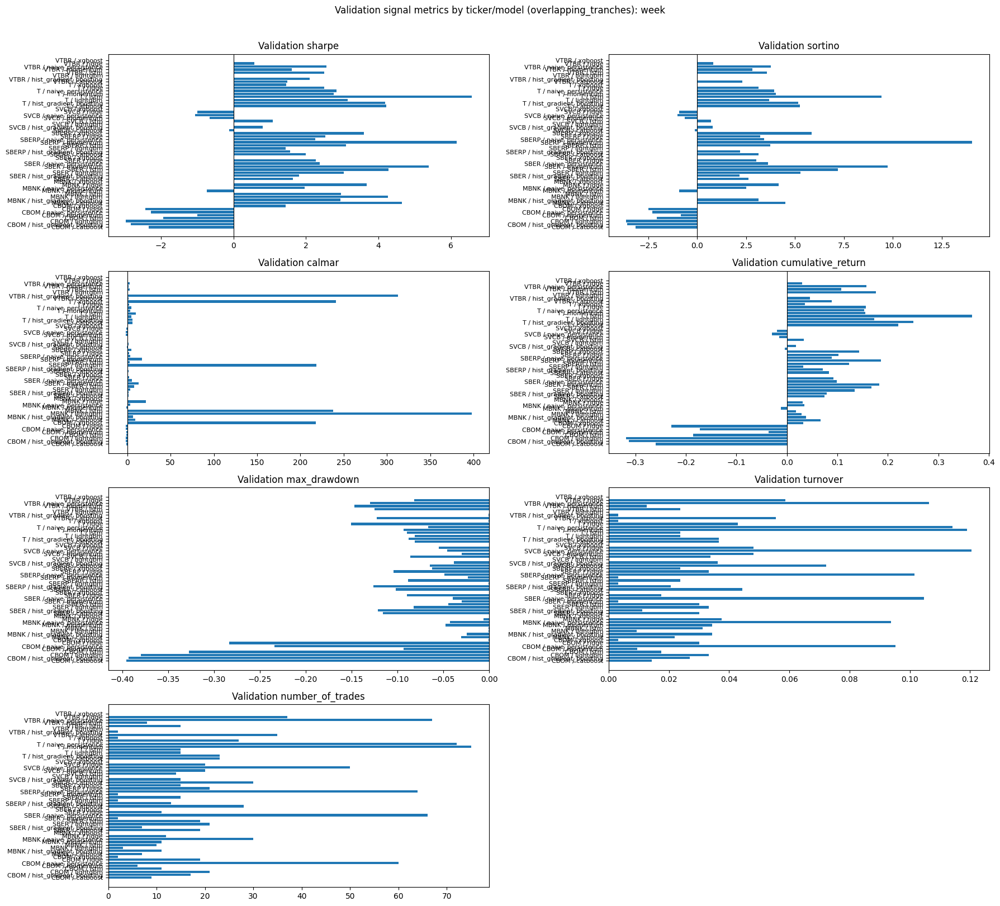

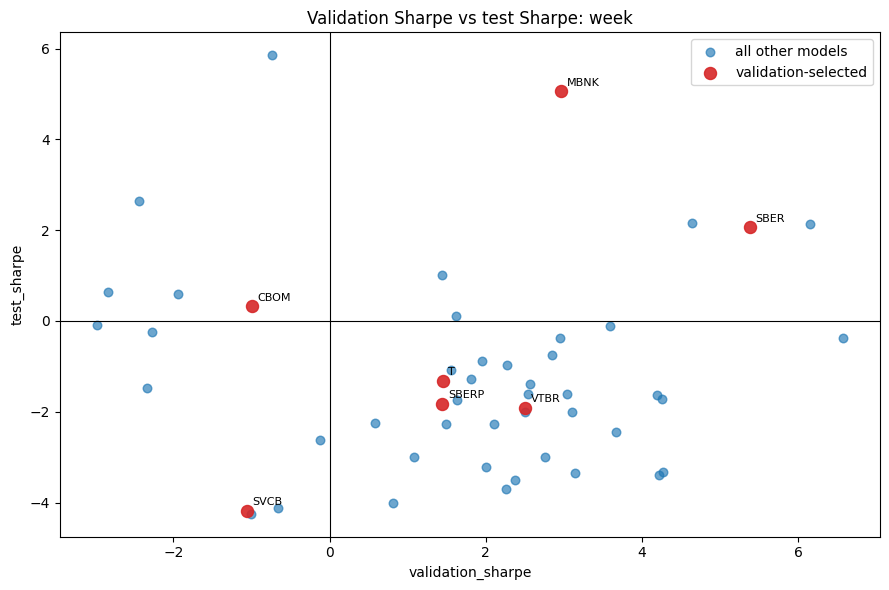

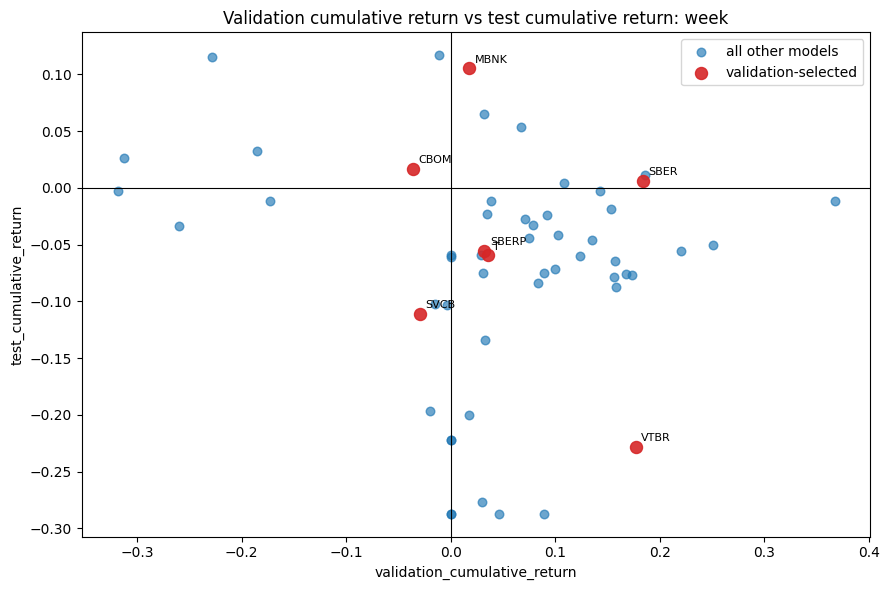

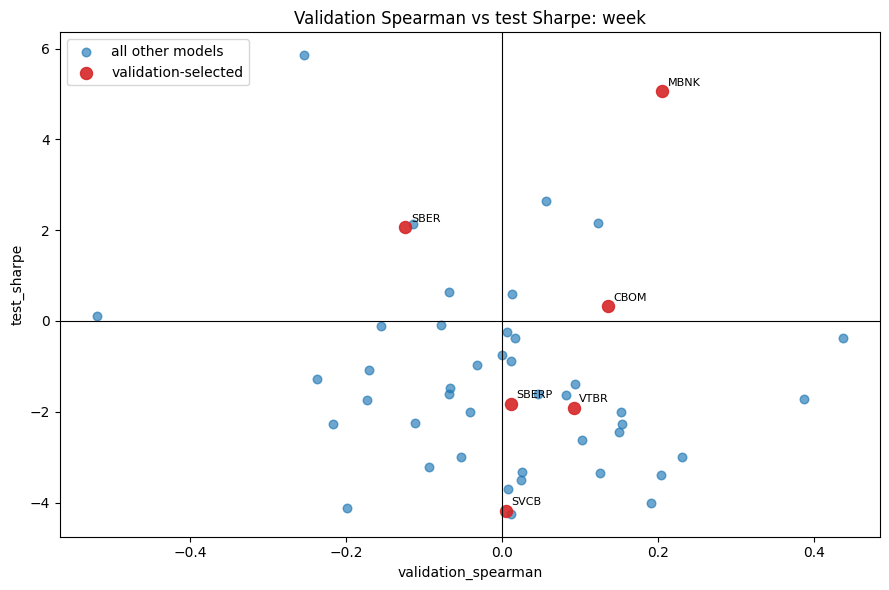

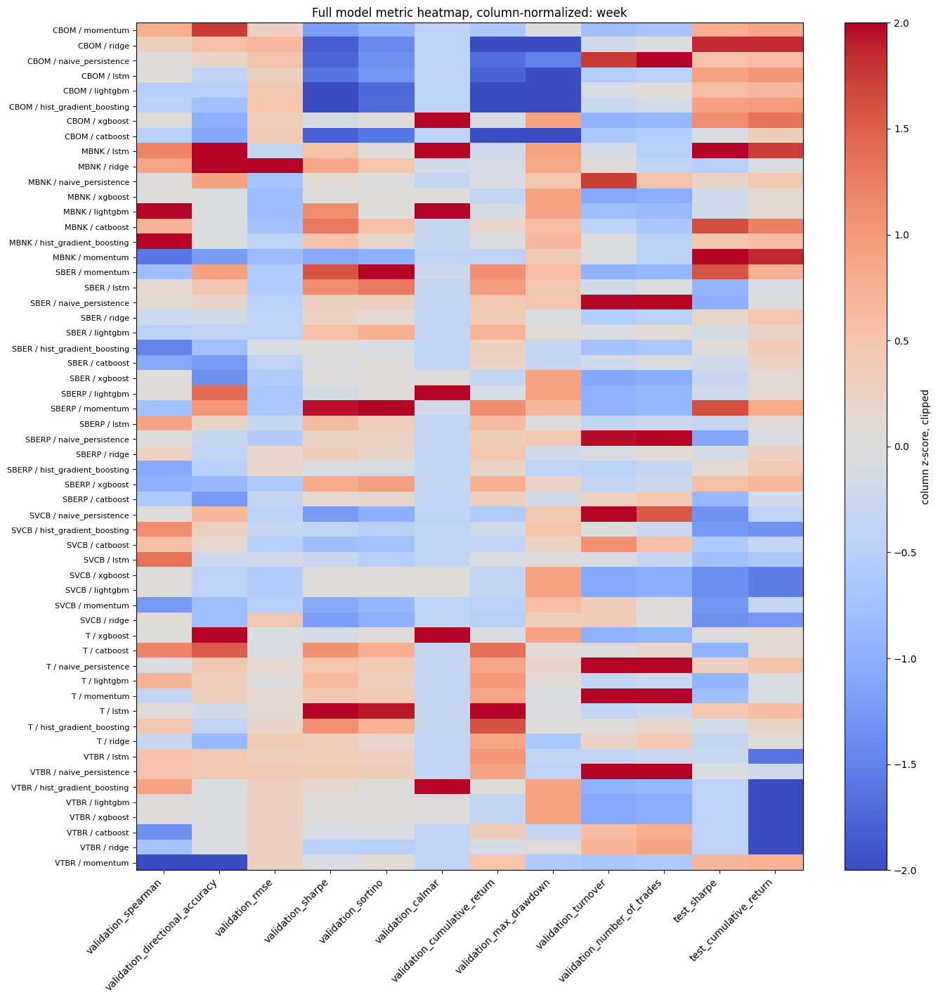

...

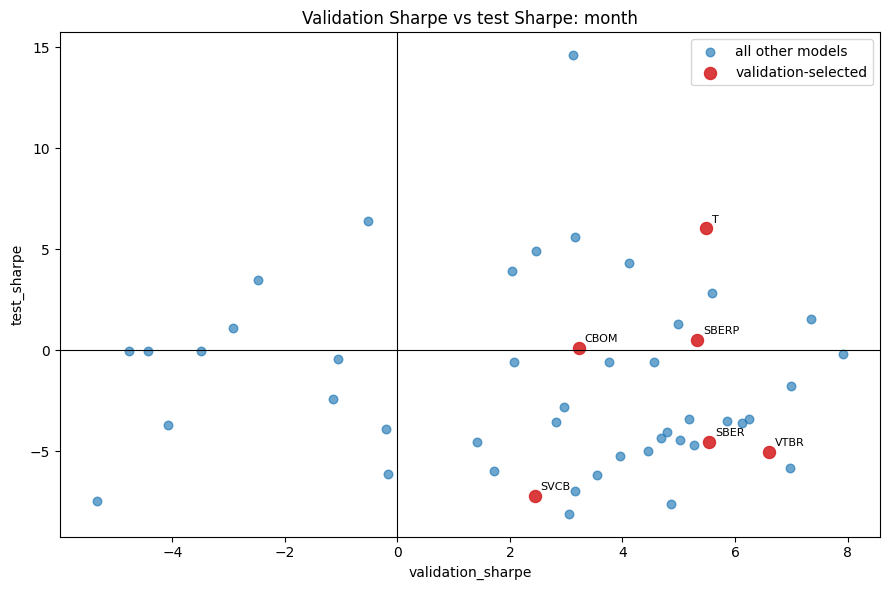

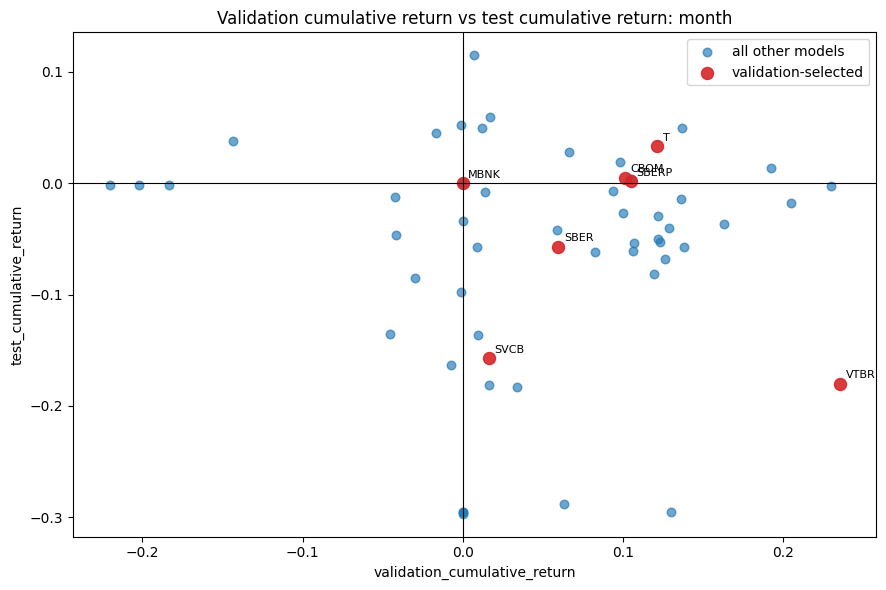

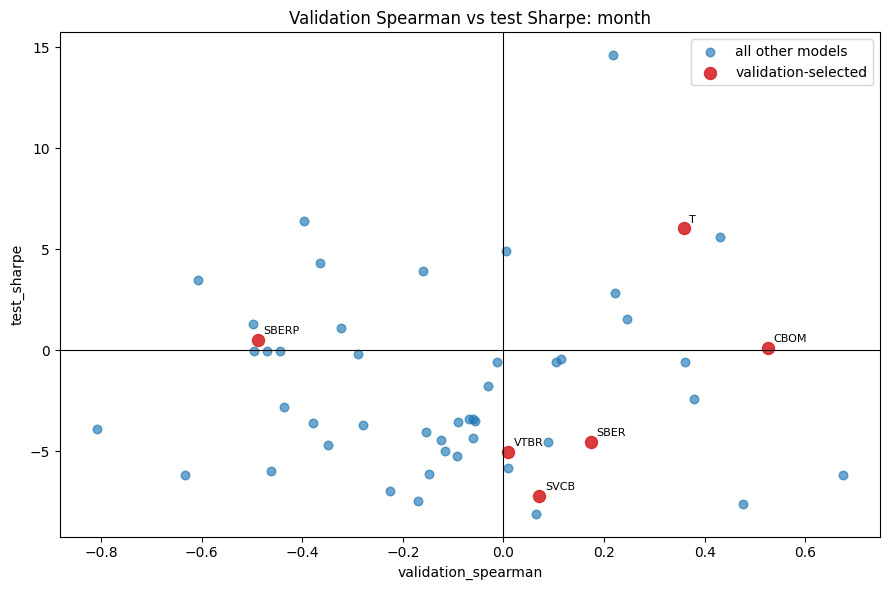

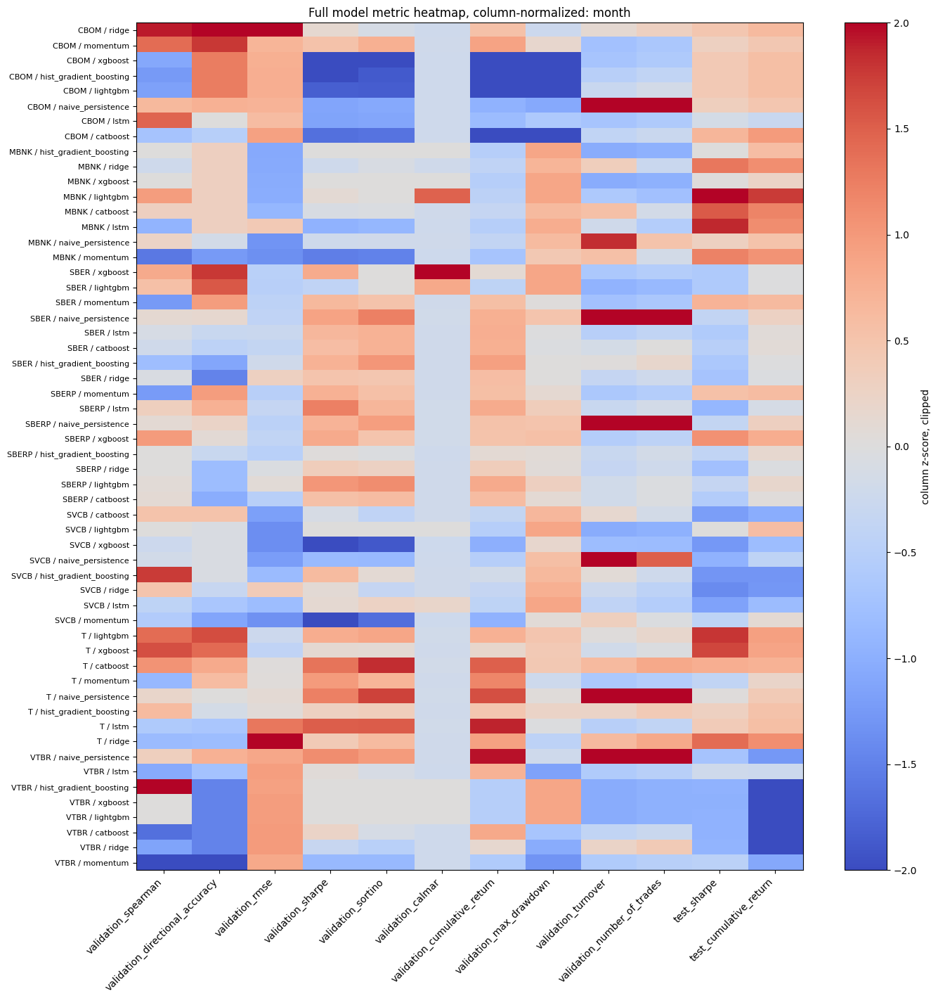

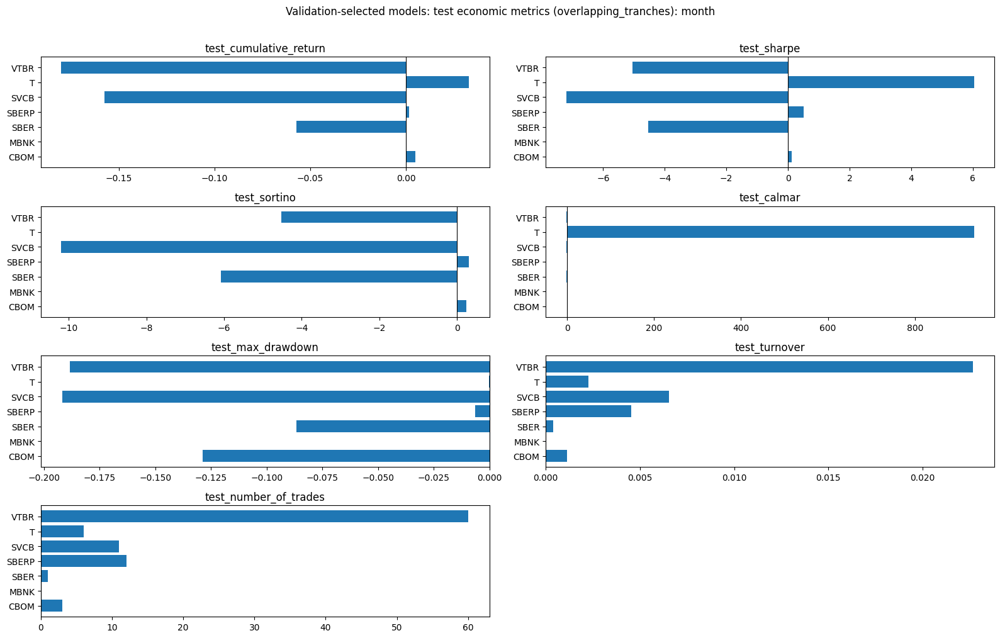

In [7]:
def plot_validation_signal_metric_bars(horizon_name: str, result: dict) -> None:
    validation_signal = headline_signal_metrics(result["validation_signal_metrics"])
    plot_cols = [col for col in VALIDATION_BAR_METRIC_COLS if col in validation_signal.columns]
    if validation_signal.empty or not plot_cols:
        return

    plot_data = validation_signal.sort_values(["ticker", "model_name"]).copy()
    plot_data["ticker_model"] = plot_data["ticker"].astype(str) + " / " + plot_data["model_name"].astype(str)
    ncols = 2
    nrows = int(np.ceil(len(plot_cols) / ncols))
    fig_height = max(10, 2 + len(plot_data) * 0.25)
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, fig_height), squeeze=False)
    for ax in axes.ravel():
        ax.set_visible(False)
    for ax, col in zip(axes.ravel(), plot_cols):
        ax.set_visible(True)
        ax.barh(plot_data["ticker_model"], plot_data[col])
        ax.axvline(0, color="black", linewidth=0.8)
        ax.set_title(f"Validation {col}")
        ax.tick_params(axis="y", labelsize=8)
    fig.suptitle(f"Validation signal metrics by ticker/model ({HEADLINE_SIGNAL_MODE}): {horizon_name}", y=1.01)
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "validation_signal_metrics_by_ticker_model.png", dpi=150, bbox_inches="tight")
    plt.show()


def plot_metric_scatter(result: dict, x_col: str, y_col: str, title: str, filename: str) -> None:
    comparison = result["validation_model_metric_comparison"]
    if x_col not in comparison.columns or y_col not in comparison.columns:
        return
    plot_data = comparison[["ticker", "model_name", "is_validation_selected", x_col, y_col]].replace([np.inf, -np.inf], np.nan).dropna(subset=[x_col, y_col])
    if plot_data.empty:
        return

    selected = plot_data[plot_data["is_validation_selected"].fillna(False).astype(bool)]
    other = plot_data.drop(selected.index)
    fig, ax = plt.subplots(figsize=(9, 6))
    ax.scatter(other[x_col], other[y_col], s=38, alpha=0.65, label="all other models")
    if not selected.empty:
        ax.scatter(selected[x_col], selected[y_col], s=75, alpha=0.9, label="validation-selected", color="tab:red")
        for _, row in selected.iterrows():
            ax.annotate(str(row["ticker"]), (row[x_col], row[y_col]), fontsize=8, xytext=(4, 4), textcoords="offset points")
    ax.axhline(0, color="black", linewidth=0.8)
    ax.axvline(0, color="black", linewidth=0.8)
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(title)
    ax.legend()
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / filename, dpi=150, bbox_inches="tight")
    plt.show()


def plot_full_metric_heatmap(horizon_name: str, result: dict) -> None:
    comparison = result["validation_model_metric_comparison"].copy()
    heatmap_cols = [
        "validation_spearman",
        "validation_directional_accuracy",
        "validation_rmse",
        "validation_sharpe",
        "validation_sortino",
        "validation_calmar",
        "validation_cumulative_return",
        "validation_max_drawdown",
        "validation_turnover",
        "validation_number_of_trades",
        "test_sharpe",
        "test_cumulative_return",
    ]
    heatmap_cols = [col for col in heatmap_cols if col in comparison.columns]
    if comparison.empty or not heatmap_cols:
        return

    heatmap = comparison.set_index("ticker_model")[heatmap_cols].replace([np.inf, -np.inf], np.nan)
    normalized = (heatmap - heatmap.mean()) / heatmap.std(ddof=0).replace(0, np.nan)
    normalized = normalized.fillna(0.0).clip(-2.0, 2.0)
    fig_height = max(8, 2 + len(heatmap) * 0.22)
    fig, ax = plt.subplots(figsize=(14, fig_height))
    image = ax.imshow(normalized.to_numpy(), aspect="auto", cmap="coolwarm", vmin=-2, vmax=2)
    ax.set_xticks(np.arange(len(heatmap_cols)))
    ax.set_xticklabels(heatmap_cols, rotation=45, ha="right")
    ax.set_yticks(np.arange(len(heatmap.index)))
    ax.set_yticklabels(heatmap.index, fontsize=8)
    ax.set_title(f"Full model metric heatmap, column-normalized: {horizon_name}")
    fig.colorbar(image, ax=ax, label="column z-score, clipped")
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "validation_test_metric_heatmap.png", dpi=150, bbox_inches="tight")
    plt.show()


def plot_selected_test_metric_bars(horizon_name: str, result: dict) -> None:
    comparison = result["validation_model_metric_comparison"]
    if "is_validation_selected" not in comparison.columns:
        return
    selected = comparison[comparison["is_validation_selected"].fillna(False).astype(bool)].sort_values("ticker")
    plot_cols = [col for col in ["test_cumulative_return", "test_sharpe", "test_sortino", "test_calmar", "test_max_drawdown", "test_turnover", "test_number_of_trades"] if col in selected.columns]
    if selected.empty or not plot_cols:
        return

    ncols = 2
    nrows = int(np.ceil(len(plot_cols) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 10), squeeze=False)
    for ax in axes.ravel():
        ax.set_visible(False)
    for ax, col in zip(axes.ravel(), plot_cols):
        ax.set_visible(True)
        ax.barh(selected["ticker"].astype(str), selected[col])
        ax.axvline(0, color="black", linewidth=0.8)
        ax.set_title(col)
    fig.suptitle(f"Validation-selected models: test economic metrics ({HEADLINE_SIGNAL_MODE}): {horizon_name}", y=1.01)
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "selected_models_test_economic_metrics.png", dpi=150, bbox_inches="tight")
    plt.show()


for horizon_name, result in horizon_results.items():
    plot_validation_signal_metric_bars(horizon_name, result)
    plot_metric_scatter(result, "validation_sharpe", "test_sharpe", f"Validation Sharpe vs test Sharpe: {horizon_name}", "validation_sharpe_vs_test_sharpe.png")
    plot_metric_scatter(result, "validation_cumulative_return", "test_cumulative_return", f"Validation cumulative return vs test cumulative return: {horizon_name}", "validation_cumulative_return_vs_test_cumulative_return.png")
    plot_metric_scatter(result, "validation_spearman", "test_sharpe", f"Validation Spearman vs test Sharpe: {horizon_name}", "validation_spearman_vs_test_sharpe.png")
    plot_full_metric_heatmap(horizon_name, result)
    plot_selected_test_metric_bars(horizon_name, result)


## Test Prediction Metrics

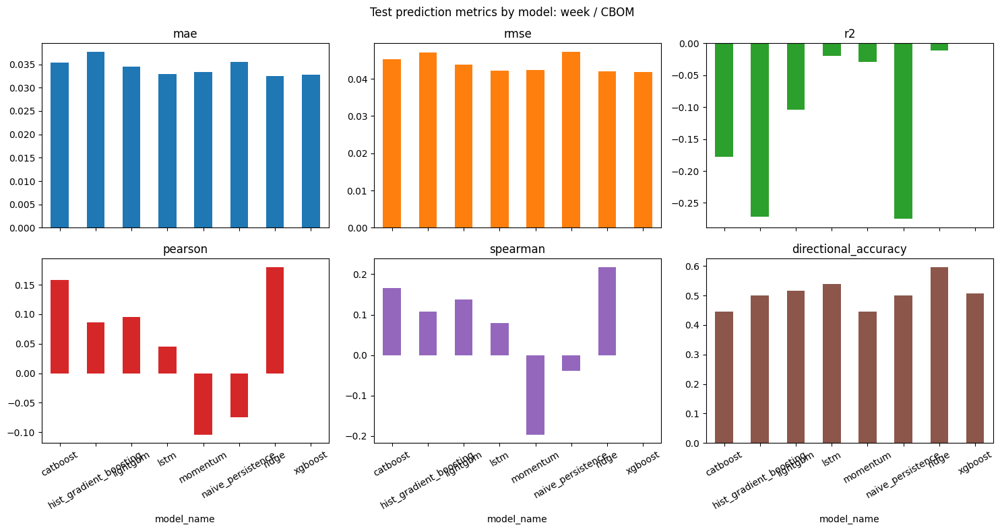

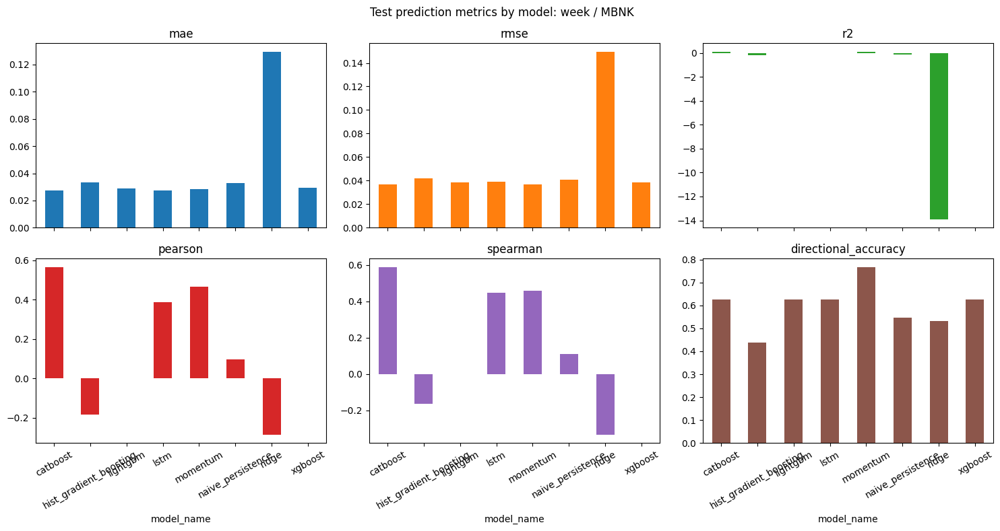

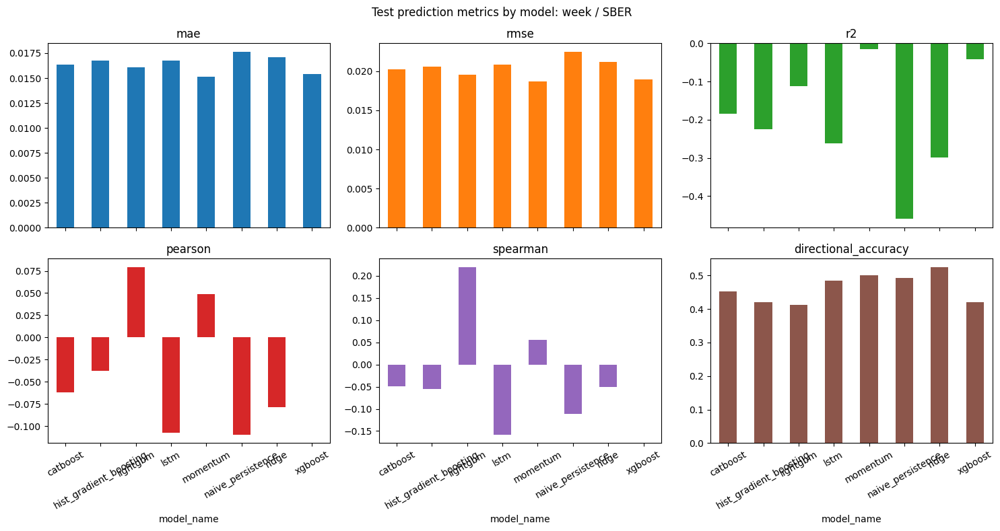

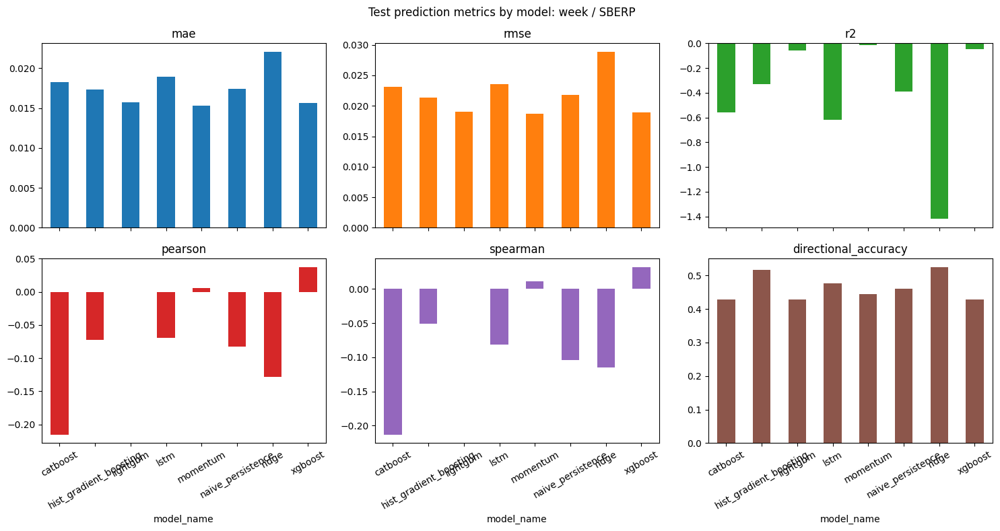

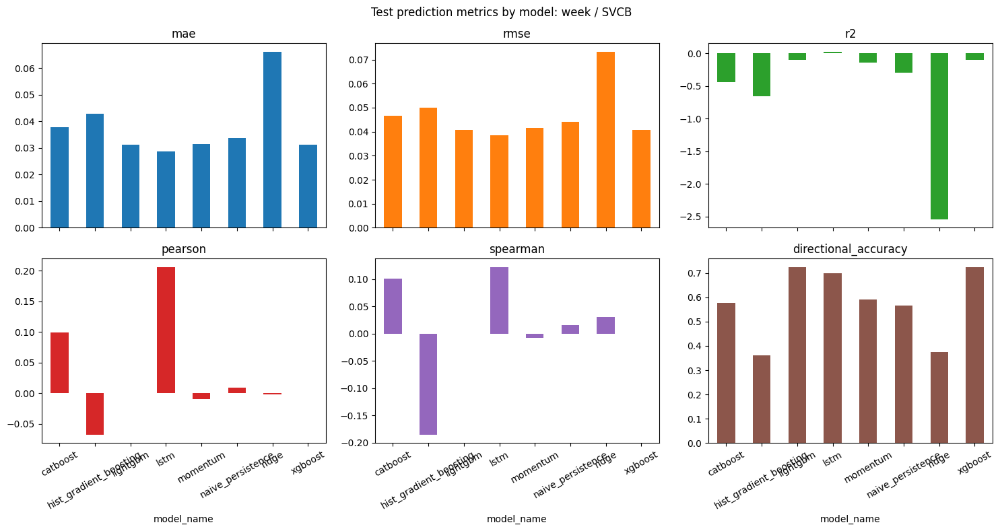

...

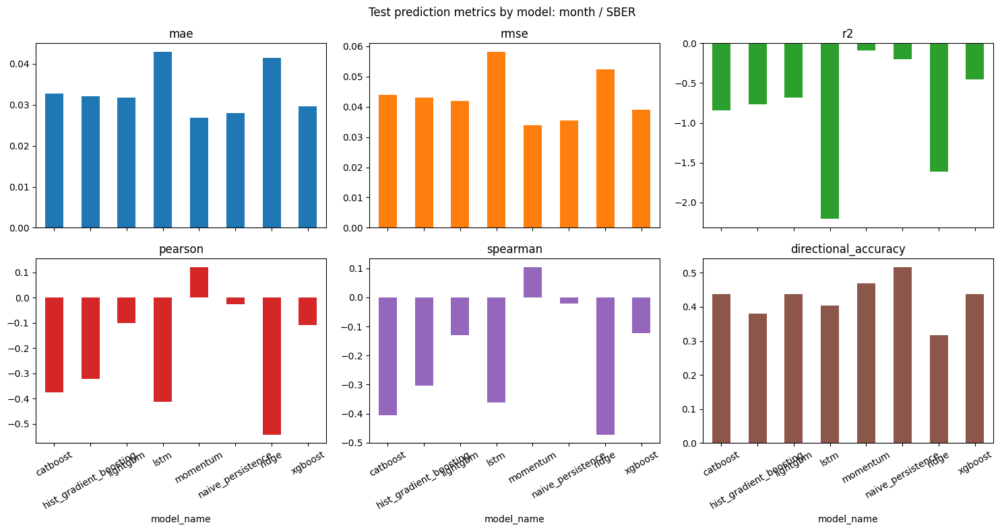

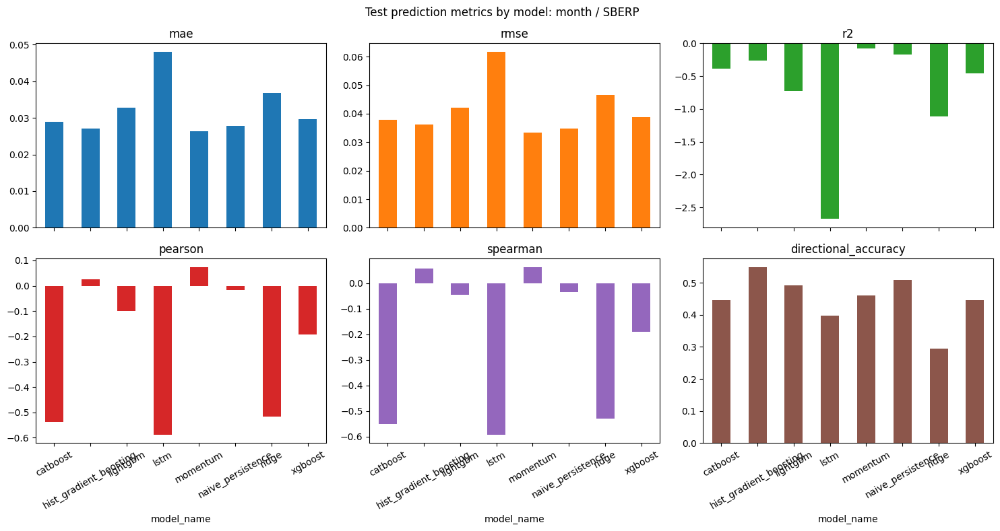

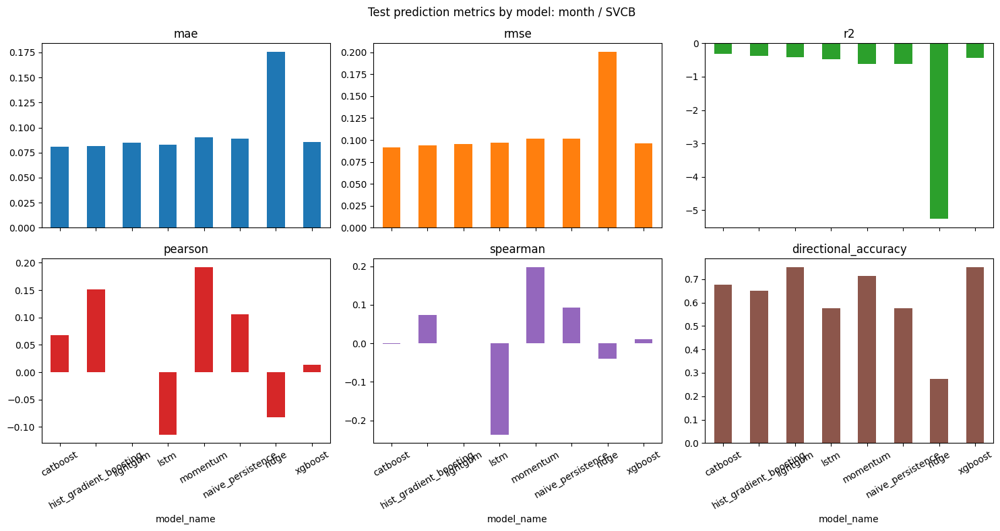

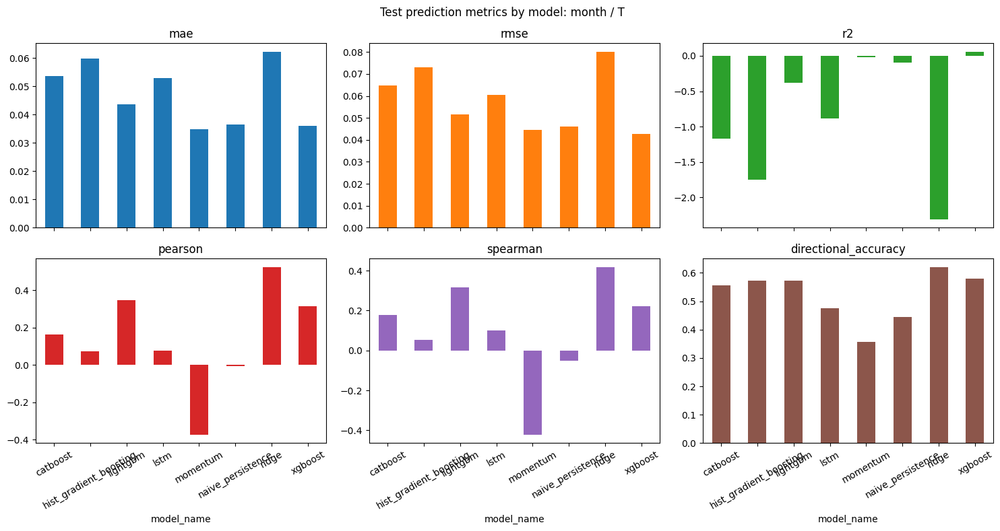

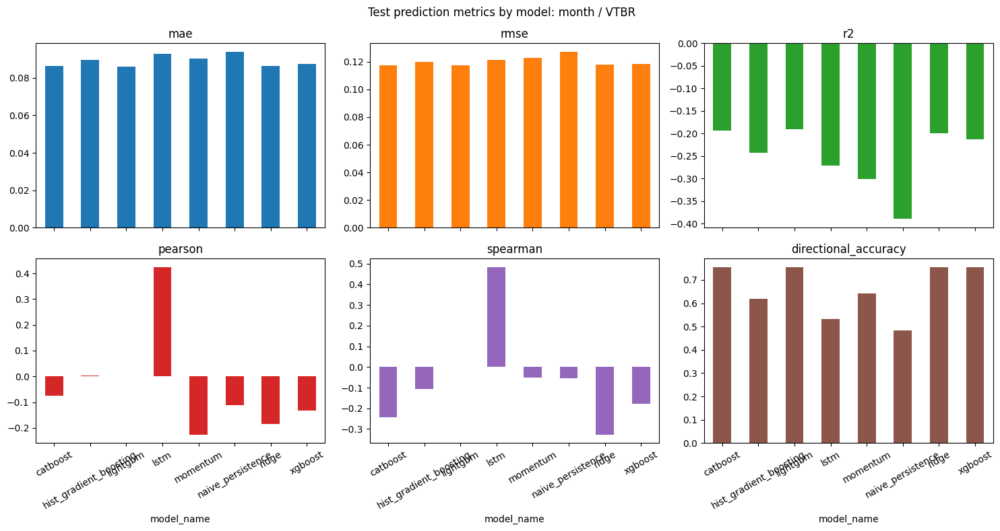

In [8]:
for horizon_name, result in horizon_results.items():
    metrics = result["test_prediction_metrics"]
    ticker_plots_dir = result["ticker_plots_dir"]

    for ticker in result["plot_tickers"]:
        ticker_metrics = metrics[metrics["ticker"].astype(str) == ticker]
        plot_cols = [col for col in PREDICTION_METRIC_COLS if col in ticker_metrics.columns]
        if ticker_metrics.empty or not plot_cols:
            continue
        plot_data = ticker_metrics.set_index("model_name")[plot_cols]
        axes = plot_data.plot(
            kind="bar",
            subplots=True,
            layout=(2, 3),
            figsize=(15, 8),
            legend=False,
            title=f"Test prediction metrics by model: {horizon_name} / {ticker}",
        )
        for ax in axes.ravel():
            ax.tick_params(axis="x", rotation=30)
        fig = axes[0][0].get_figure()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_filename(ticker)}_test_prediction_metrics.png", dpi=150, bbox_inches="tight")
        plt.show()


## Test Predicted Vs Actual And Distributions For Each Ticker


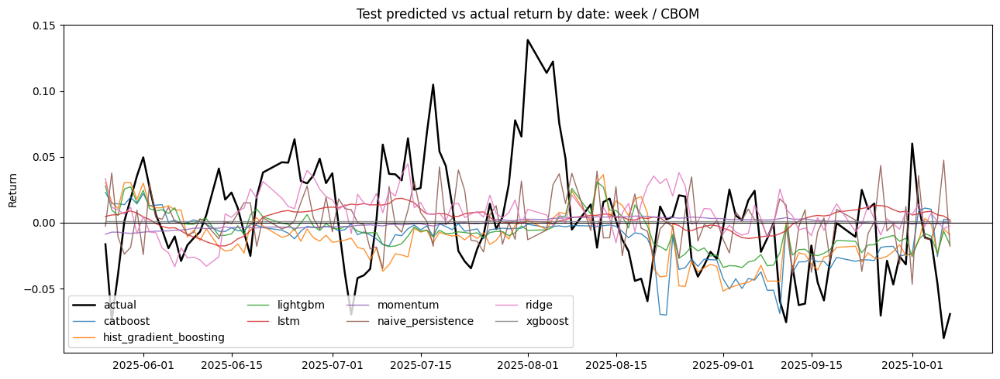

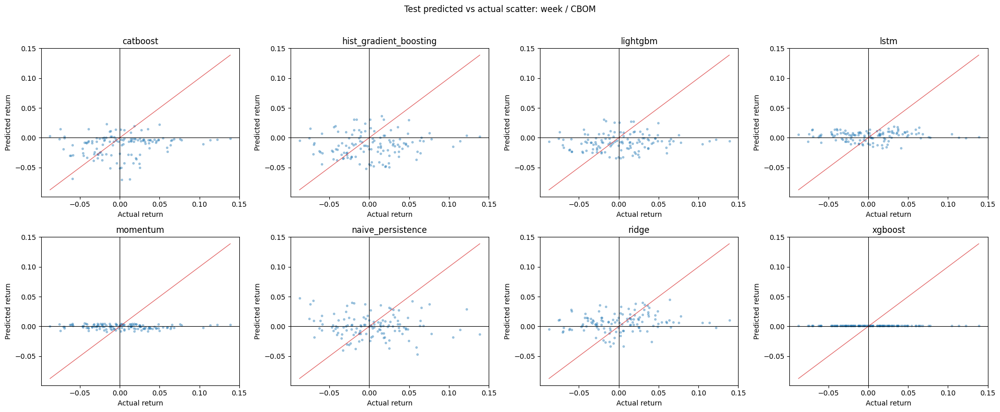

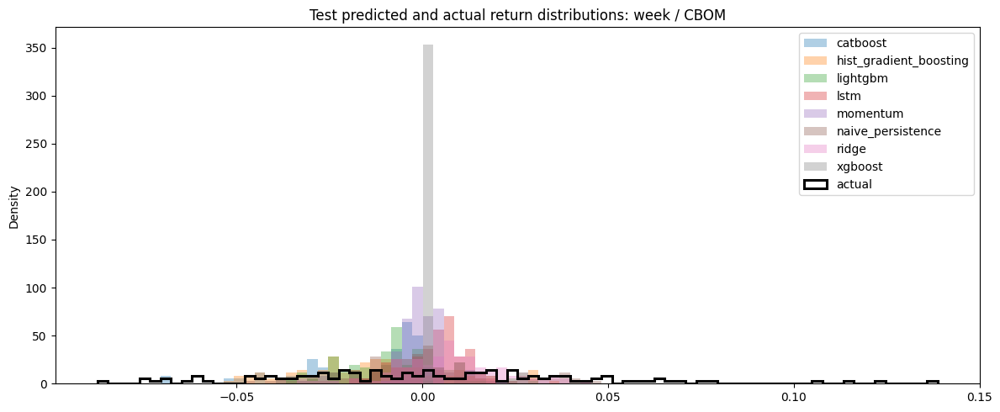

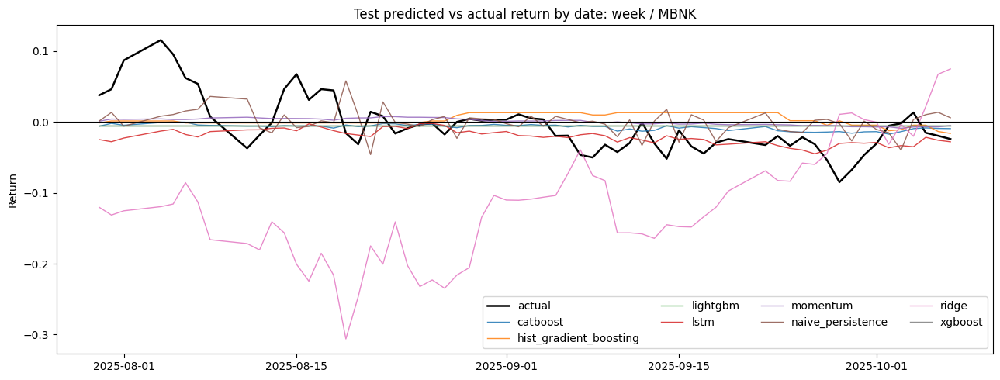

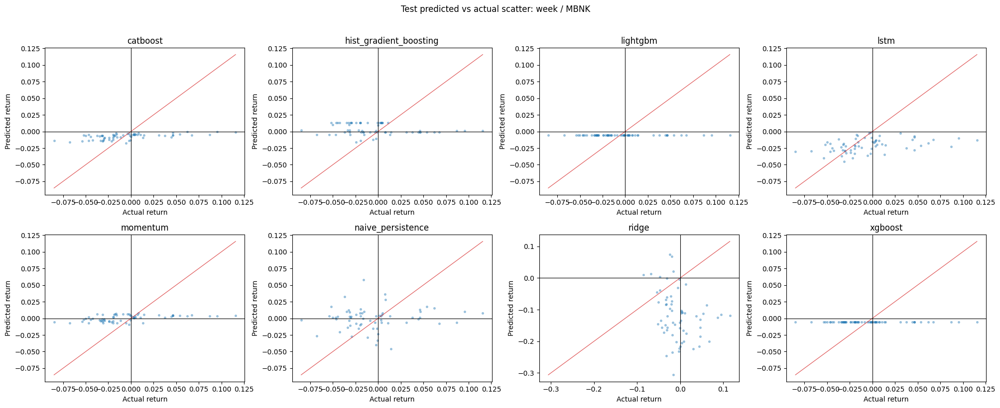

...

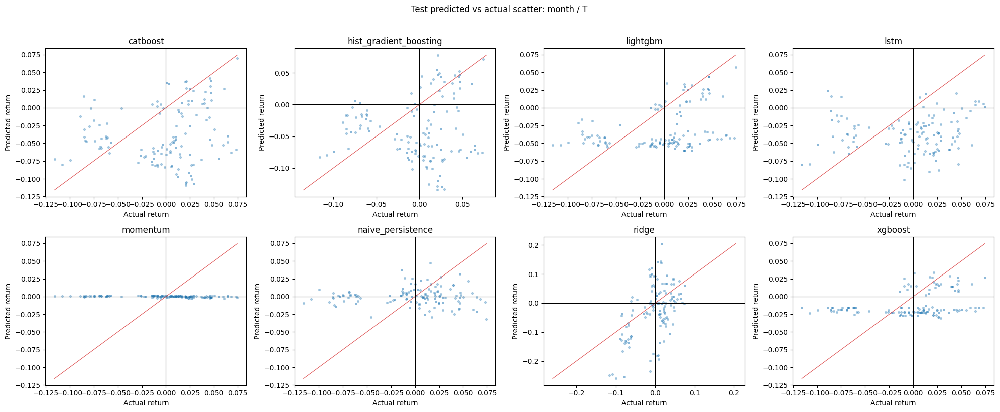

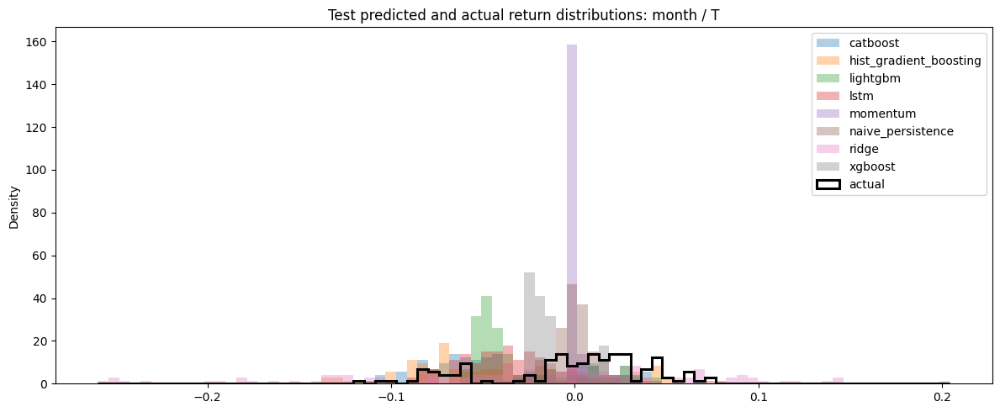

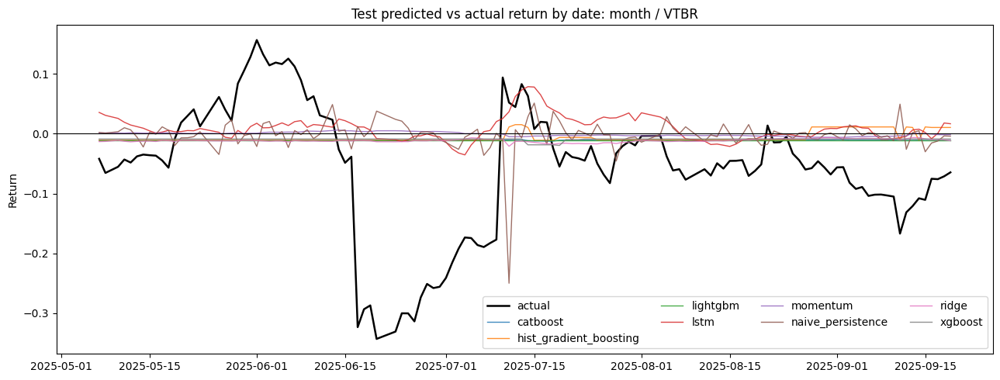

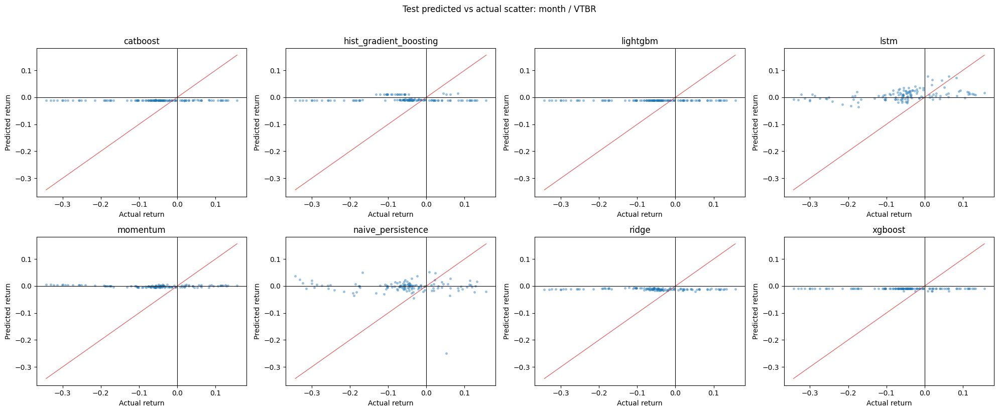

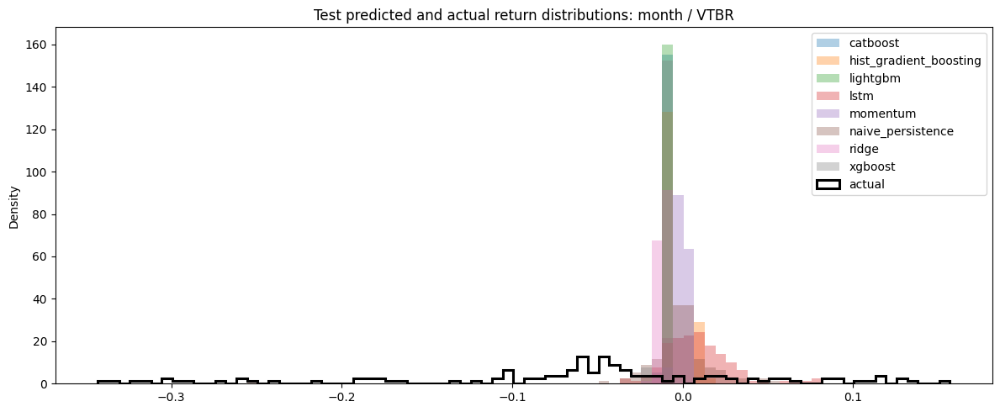

In [9]:
for horizon_name, result in horizon_results.items():
    test_predictions = result["test_predictions"]
    ticker_plots_dir = result["ticker_plots_dir"]
    models = sorted(test_predictions["model_name"].dropna().astype(str).unique())

    for ticker in result["plot_tickers"]:
        ticker_predictions = test_predictions[test_predictions["ticker"].astype(str) == ticker].sort_values("date")
        if ticker_predictions.empty:
            continue
        safe_ticker = safe_filename(ticker)

        actual = ticker_predictions.drop_duplicates(["date", "ticker"]).sort_values("date")
        fig, ax = plt.subplots(figsize=(13, 5))
        ax.plot(actual["date"], actual["y_true"], color="black", linewidth=1.8, label="actual")
        for model_name, group in ticker_predictions.groupby("model_name", sort=True):
            ax.plot(group["date"], group["y_pred"], linewidth=1.0, alpha=0.85, label=str(model_name))
        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_title(f"Test predicted vs actual return by date: {horizon_name} / {ticker}")
        ax.set_ylabel("Return")
        ax.legend(ncol=min(ticker_predictions["model_name"].nunique() + 1, 4))
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_predicted_vs_actual_by_date.png", dpi=150, bbox_inches="tight")
        plt.show()

        n_models = max(len(models), 1)
        ncols = min(n_models, 4)
        nrows = int(np.ceil(n_models / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows), squeeze=False)
        for ax in axes.ravel():
            ax.set_visible(False)
        for ax, model_name in zip(axes.ravel(), models):
            ax.set_visible(True)
            part = ticker_predictions[ticker_predictions["model_name"].astype(str) == model_name]
            part = part[["y_true", "y_pred"]].dropna()
            if len(part) > SCATTER_SAMPLE:
                part = part.sample(SCATTER_SAMPLE, random_state=42)
            ax.scatter(part["y_true"], part["y_pred"], s=7, alpha=0.35)
            if not part.empty:
                lo = float(np.nanmin([part["y_true"].min(), part["y_pred"].min()]))
                hi = float(np.nanmax([part["y_true"].max(), part["y_pred"].max()]))
                ax.plot([lo, hi], [lo, hi], color="tab:red", linewidth=0.9, alpha=0.75, label="y = x")
            ax.axhline(0, color="black", linewidth=0.8)
            ax.axvline(0, color="black", linewidth=0.8)
            ax.set_title(str(model_name))
            ax.set_xlabel("Actual return")
            ax.set_ylabel("Predicted return")
        fig.suptitle(f"Test predicted vs actual scatter: {horizon_name} / {ticker}", y=1.02)
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_predicted_vs_actual_scatter.png", dpi=150, bbox_inches="tight")
        plt.show()

        actual_returns = actual["y_true"].dropna()
        predicted_returns = ticker_predictions["y_pred"].dropna()
        combined_returns = pd.concat([predicted_returns, actual_returns], ignore_index=True)
        if combined_returns.empty:
            continue
        distribution_bins = np.histogram_bin_edges(combined_returns, bins=80)
        fig, ax = plt.subplots(figsize=(12, 5))
        for model_name, group in ticker_predictions.groupby("model_name", sort=True):
            group["y_pred"].dropna().plot(
                kind="hist",
                bins=distribution_bins,
                alpha=0.35,
                ax=ax,
                label=str(model_name),
                density=True,
            )
        ax.hist(actual_returns, bins=distribution_bins, density=True, histtype="step", linewidth=2.2, color="black", label="actual")
        ax.set_title(f"Test predicted and actual return distributions: {horizon_name} / {ticker}")
        ax.set_ylabel("Density")
        ax.legend()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_prediction_distribution.png", dpi=150, bbox_inches="tight")
        plt.show()


## Test Signal Equity And Metrics

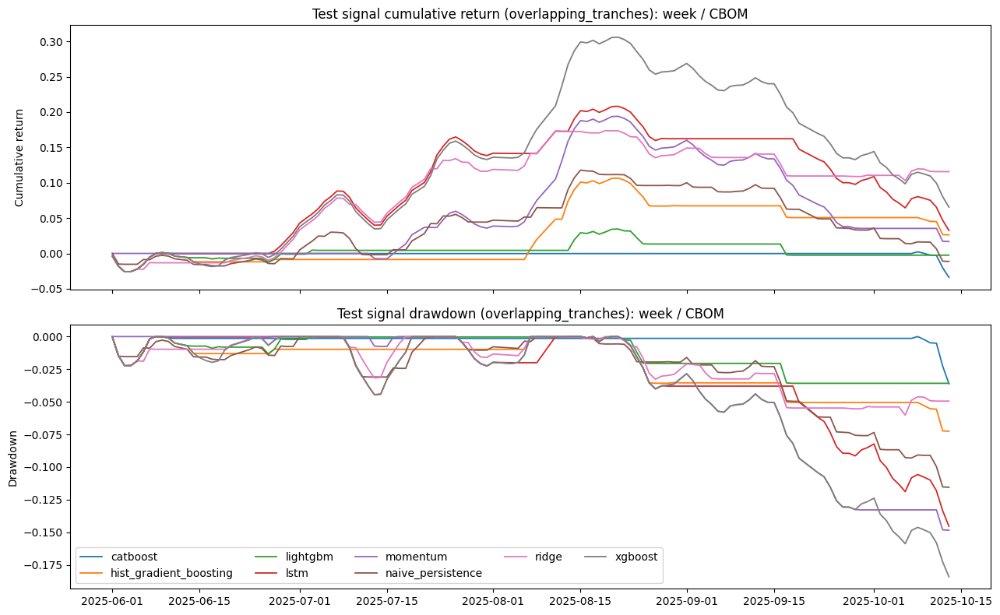

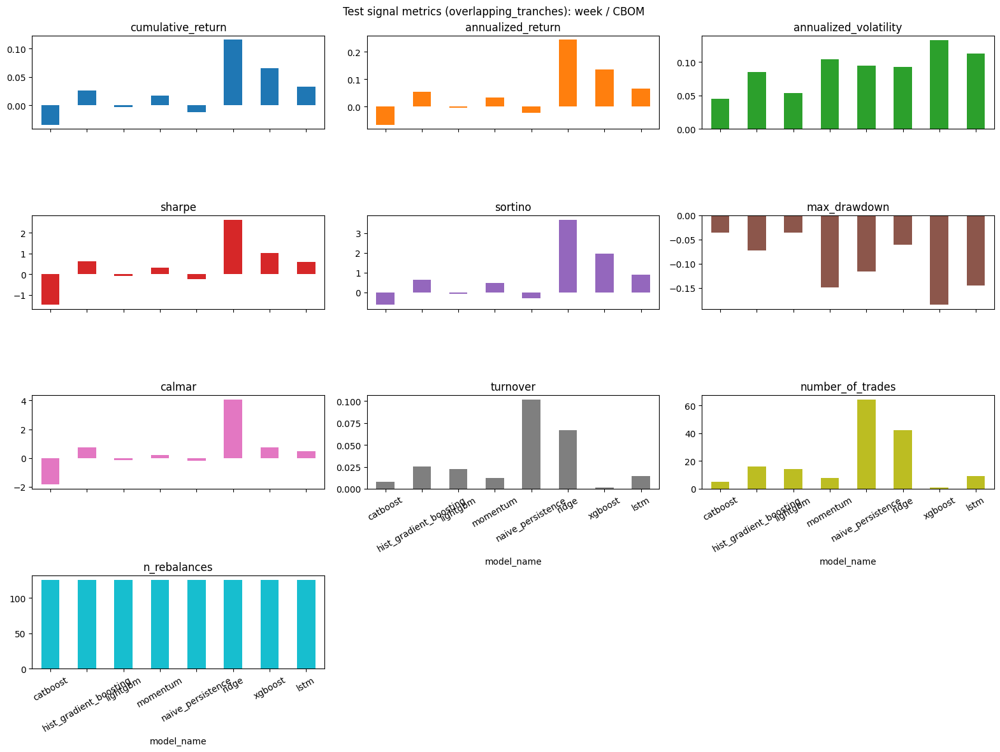

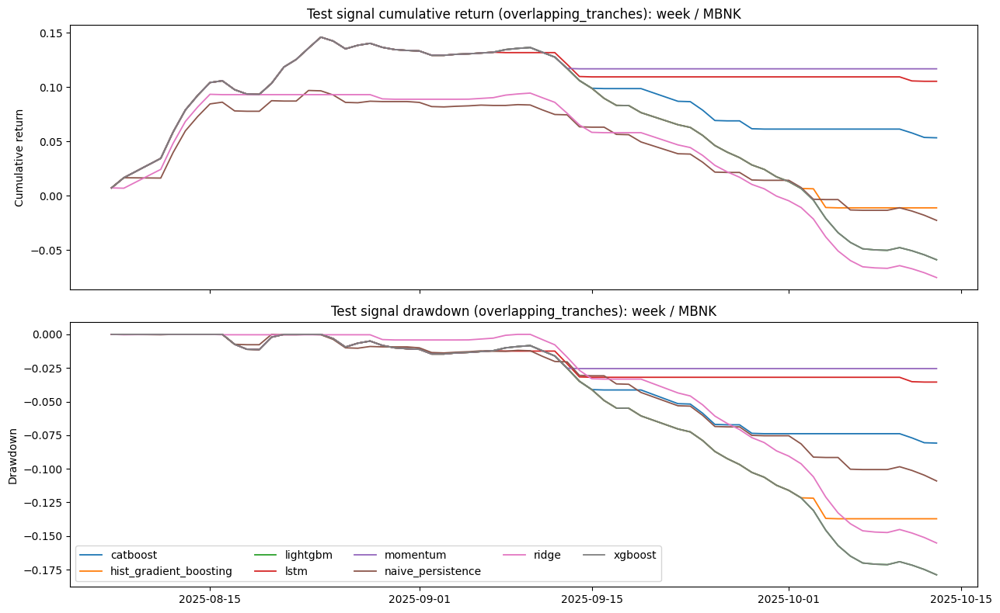

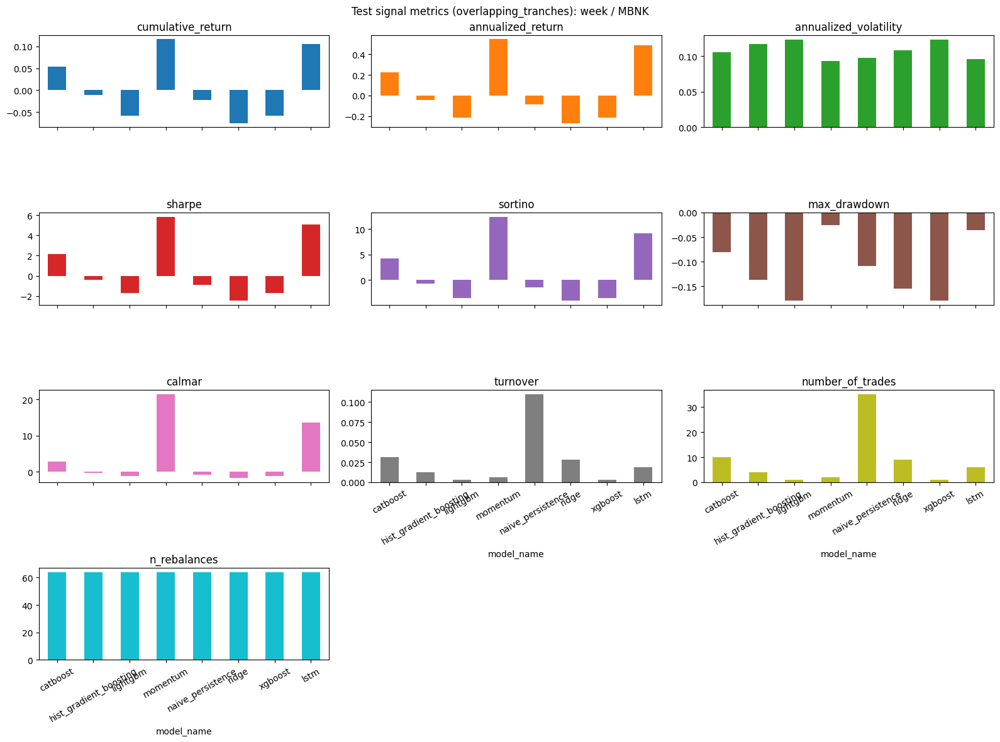

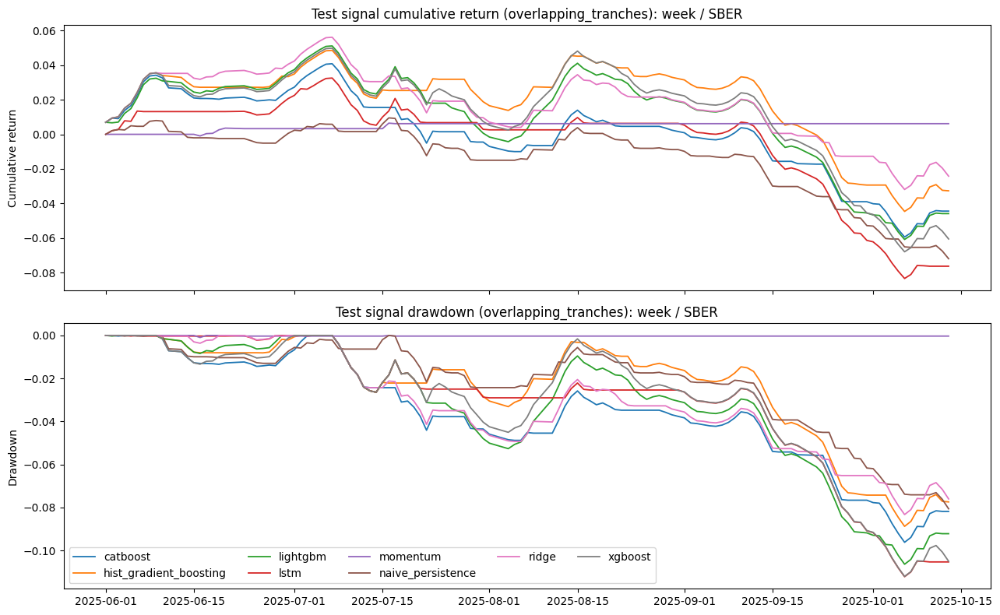

...

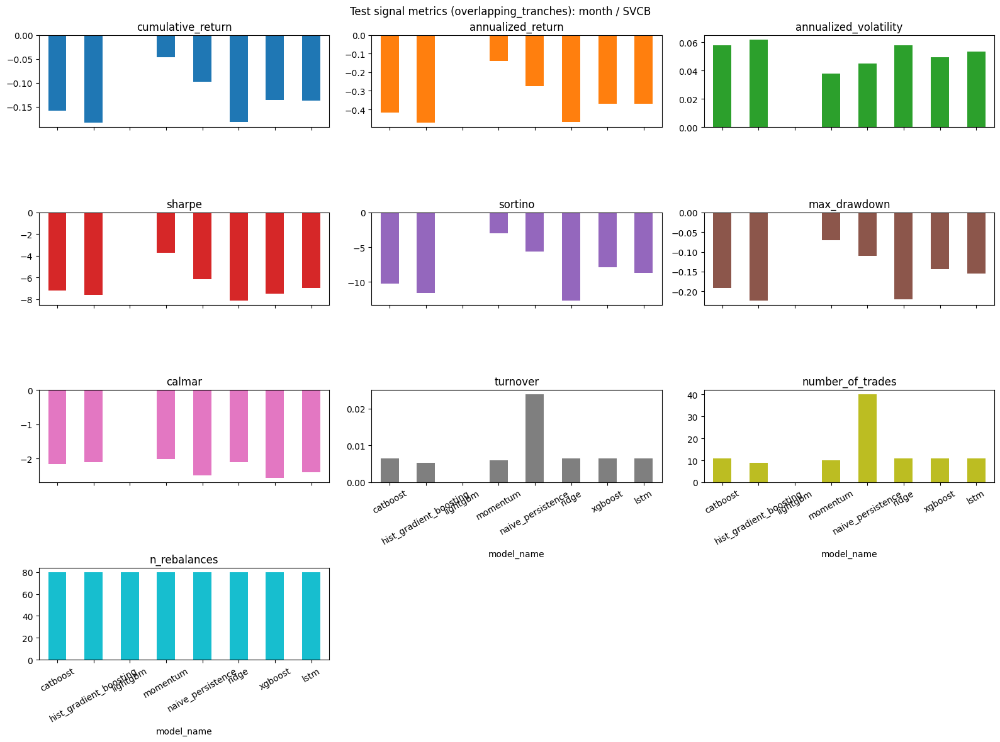

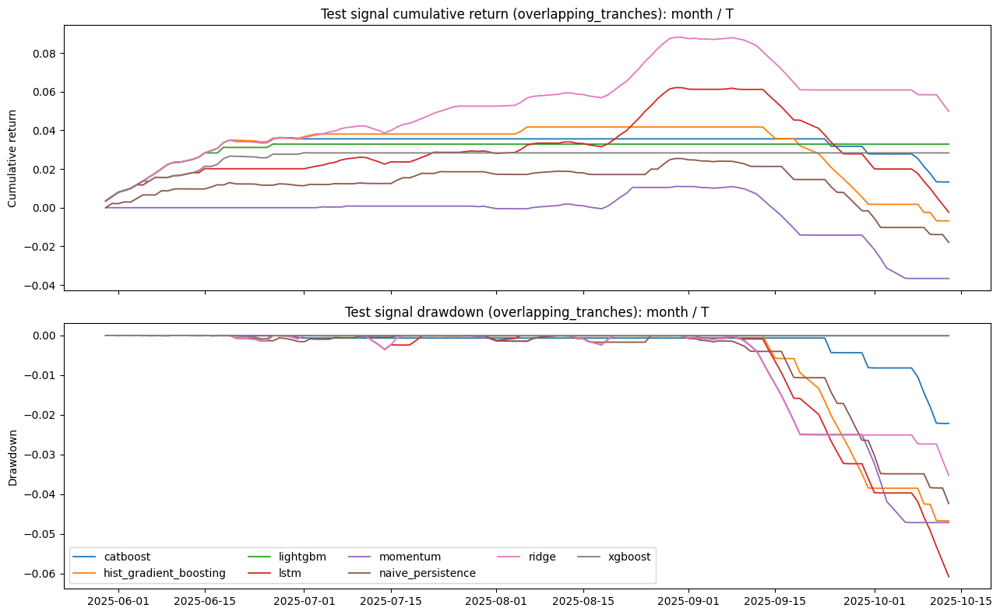

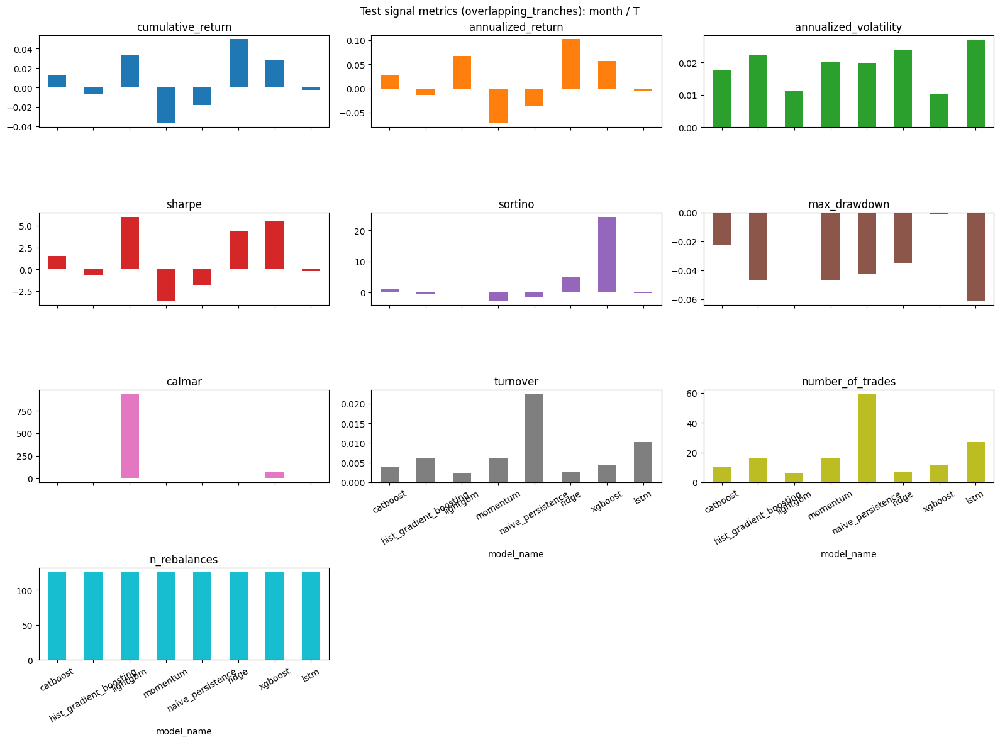

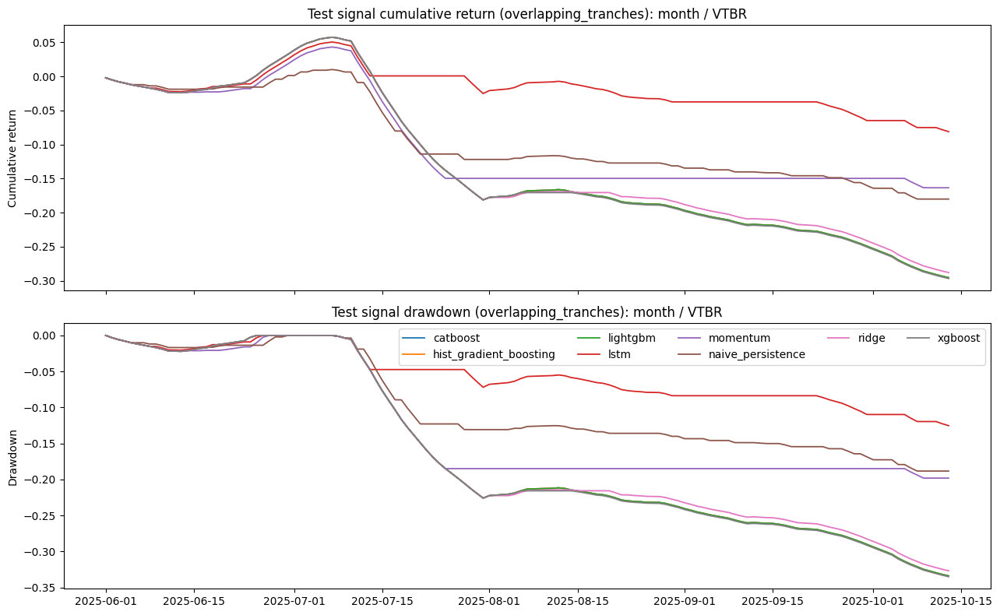

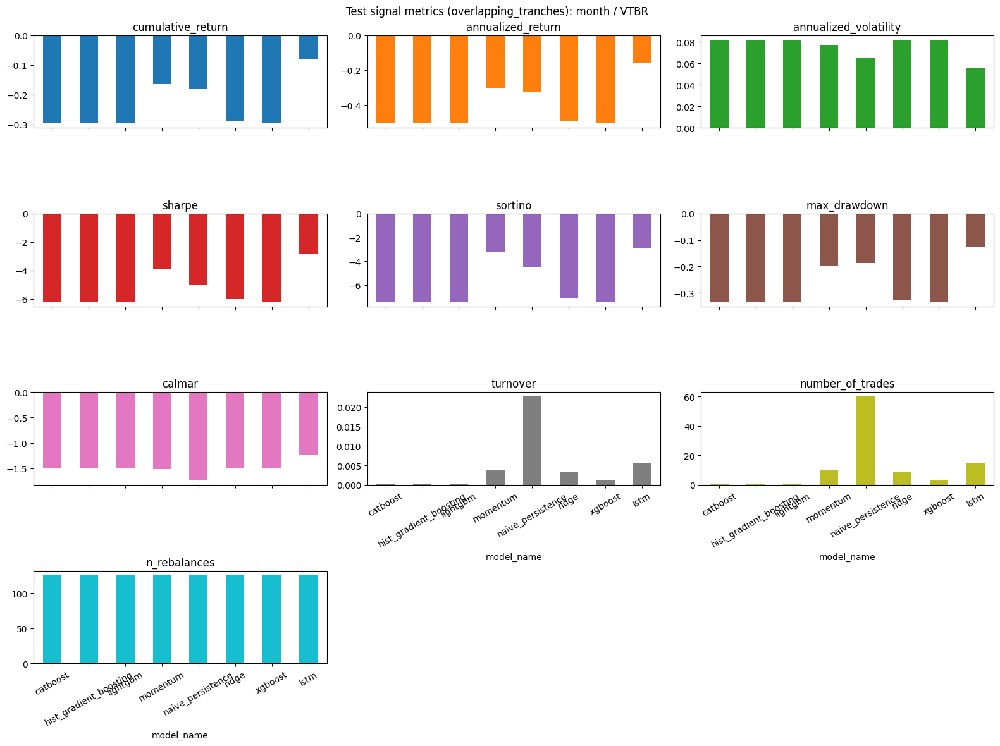

In [10]:
for horizon_name, result in horizon_results.items():
    equity = result["test_signal_equity"]
    signal_metrics = result["test_signal_metrics"]
    ticker_plots_dir = result["ticker_plots_dir"]

    headline_equity = equity[equity["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()
    headline_metrics = signal_metrics[signal_metrics["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()
    if headline_equity.empty:
        print(f"No test signal equity data for {horizon_name}")
        continue

    for ticker in result["plot_tickers"]:
        safe_ticker = safe_filename(ticker)
        ticker_equity = headline_equity[headline_equity["ticker"].astype(str) == ticker].sort_values("date")
        ticker_signal_metrics = headline_metrics[headline_metrics["ticker"].astype(str) == ticker]
        if ticker_equity.empty:
            continue

        fig, axes = plt.subplots(2, 1, figsize=(13, 8), sharex=True)
        for model_name, group in ticker_equity.groupby("model_name"):
            axes[0].plot(group["date"], group["cumulative_return"], label=model_name, linewidth=1.3)
            axes[1].plot(group["date"], group["drawdown"], label=model_name, linewidth=1.3)
        axes[0].set_title(f"Test signal cumulative return ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}")
        axes[0].set_ylabel("Cumulative return")
        axes[1].set_title(f"Test signal drawdown ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}")
        axes[1].set_ylabel("Drawdown")
        axes[1].legend(ncol=min(ticker_equity["model_name"].nunique(), 5))
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_signal_equity_drawdown.png", dpi=150, bbox_inches="tight")
        plt.show()

        plot_cols = [col for col in SIGNAL_METRIC_COLS if col in ticker_signal_metrics.columns]
        if ticker_signal_metrics.empty or not plot_cols:
            continue
        signal_plot = ticker_signal_metrics.set_index("model_name")[plot_cols]
        axes = signal_plot.plot(
            kind="bar",
            subplots=True,
            layout=(4, 3),
            figsize=(16, 12),
            legend=False,
            title=f"Test signal metrics ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}",
        )
        for ax in axes.ravel():
            ax.tick_params(axis="x", rotation=30)
        fig = axes[0][0].get_figure()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_signal_metrics.png", dpi=150, bbox_inches="tight")
        plt.show()


## Final Strict Comparison Report

In [11]:
combined_payload = {"primary_metric": PRIMARY_METRIC, "signal_mode": HEADLINE_SIGNAL_MODE, "horizons": {}}
combined_lines = [
    "# Strict Validation And Test Per-Ticker Model Comparison",
    "",
    "This is research code, not financial advice.",
    "",
    f"Primary validation ranking metric: `{PRIMARY_METRIC}`",
    f"Headline signal mode: `{HEADLINE_SIGNAL_MODE}`",
    "",
    "Validation metrics are model-selection diagnostics; test metrics remain out-of-sample evaluation.",
]

for horizon_name, result in horizon_results.items():
    reports_dir = result["reports_dir"]
    payload = {
        "horizon_name": horizon_name,
        "horizon": result["horizon"],
        "outer_splits": result["outer_splits"].to_dict(orient="records"),
        "validation_model_ranking": result["validation_model_ranking"].to_dict(orient="records"),
        "selected_models_by_ticker": result["selected_models_by_ticker"].to_dict(orient="records"),
        "validation_prediction_metrics": result["validation_prediction_metrics"].to_dict(orient="records"),
        "validation_signal_metrics": result["validation_signal_metrics"].to_dict(orient="records"),
        "validation_model_metric_comparison": result["validation_model_metric_comparison"].to_dict(orient="records"),
        "lstm_hyperparameter_summary": result.get("lstm_hyperparameter_summary", pd.DataFrame()).to_dict(orient="records"),
        "test_prediction_metrics": result["test_prediction_metrics"].to_dict(orient="records"),
        "test_signal_metrics": result["test_signal_metrics"].to_dict(orient="records"),
        "leakage_audit": result["leakage_audit"].to_dict(orient="records"),
        "artifacts": {
            "test_predictions": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/test_predictions.parquet",
            "validation_predictions": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/validation_predictions.parquet",
            "outer_splits": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/outer_splits.parquet",
            "validation_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/validation_signal_metrics.parquet",
            "validation_model_metric_comparison": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/validation_model_metric_comparison.parquet",
            "lstm_hyperparameter_summary": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/lstm_hyperparameter_summary.parquet",
            "ticker_plots": f"artifacts/horizons/{horizon_name}/strict_protocol/plots/tickers/",
            "summary_plots": f"artifacts/horizons/{horizon_name}/strict_protocol/plots/summary/",
        },
    }
    save_json(payload, reports_dir / "final_strict_comparison.json")
    combined_payload["horizons"][horizon_name] = payload

    lines = [
        f"# Strict Validation And Test Per-Ticker Model Comparison: {horizon_name}",
        "",
        "This is research code, not financial advice.",
        "",
        f"Horizon: `{result['horizon']}` trading days",
        f"Primary validation ranking metric: `{PRIMARY_METRIC}`",
        f"Headline signal mode: `{HEADLINE_SIGNAL_MODE}`",
        "",
        "## Outer Splits",
        "",
        "```text\n" + result["outer_splits"].to_string(index=False) + "\n```",
        "",
        "## Validation Model Ranking",
        "",
        "```text\n" + result["validation_model_ranking"].to_string(index=False) + "\n```",
        "",
        "## Validation-Selected Models",
        "",
        "```text\n" + result["selected_models_by_ticker"].to_string(index=False) + "\n```",
        "",
        "## Validation Signal Metrics",
        "",
        "```text\n" + result["validation_signal_metrics"].to_string(index=False) + "\n```",
        "",
        "## Validation-Vs-Test Model Metric Comparison",
        "",
        "```text\n" + result["validation_model_metric_comparison"].to_string(index=False) + "\n```",
        "",
        "## LSTM Hyperparameter Summary",
        "",
        "```text\n" + result.get("lstm_hyperparameter_summary", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "## Test Prediction Metrics",
        "",
        "```text\n" + result["test_prediction_metrics"].to_string(index=False) + "\n```",
        "",
        "## Test Signal Metrics",
        "",
        "```text\n" + result["test_signal_metrics"].to_string(index=False) + "\n```",
        "",
        "## Leakage Audit",
        "",
        "```text\n" + result["leakage_audit"].to_string(index=False) + "\n```",
    ]
    (reports_dir / "final_strict_comparison.md").write_text("\n".join(lines), encoding="utf-8")
    combined_lines.extend(["", f"## {horizon_name.title()} Horizon", ""] + lines[8:])

save_json(combined_payload, REPORTS_DIR / "final_strict_comparison.json")
(REPORTS_DIR / "final_strict_comparison.md").write_text("\n".join(combined_lines), encoding="utf-8")


292508